In [1]:
import cv2
import numpy as np
import os
from scipy.interpolate import interp1d
from pyefd import elliptic_fourier_descriptors
import matplotlib.pyplot as plt
import statistics

In [2]:
%matplotlib inline

In [3]:
# All Requirdef read_images_and_extract_contours_single_image(img_location):

def read_image_and_extract_contour(img_location):
    """Read an image from a given path and extract its largest external contour."""

    image = cv2.imread(img_location)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    if contours:
        # Find the largest contour
        contour = max(contours, key=cv2.contourArea)
        contour = contour.squeeze()  # Remove unnecessary dimensions
        return normalize_contour_points(contour)
    else:
        return None  # Return None if no contours are found

def normalize_contour_points(contour):
    """Normalize contour points to a fixed number for consistency."""
    N = 250
    contour_length = np.linspace(0, 1, len(contour))
    normalized_length = np.linspace(0, 1, N)
    interp_func_x = interp1d(contour_length, contour[:, 0], kind='linear')
    interp_func_y = interp1d(contour_length, contour[:, 1], kind='linear')
    normalized_contour = np.vstack((interp_func_x(normalized_length), interp_func_y(normalized_length))).T
    return normalized_contour

def compute_first_10_harmonics(contour, order=30):
    """Compute Fourier coefficients and return the first 10 harmonics."""
    coeffs = elliptic_fourier_descriptors(contour, order=order, normalize=True)
    first_10_harmonics = coeffs[:10]  # Extract the first 10 harmonics
    return first_10_harmonics

def show_image(image_path):
    """Display an image."""
    image = cv2.imread(image_path)

    if image is None:
        print(f"Error loading image: {image_path}")
    else:
        rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image
    plt.imshow(rgb_image)
    plt.title(image_path)
    plt.axis('off')
    plt.show()


def plot_harmonic_distribution(harmonics):
    """Plot the distribution of the first 10 harmonic or coefficients as magnitudes."""
    # Compute magnitudes for each harmonic (A_n, B_n, C_n, D_n)
    magnitudes = np.linalg.norm(harmonics, axis=1)  # Calculate sqrt(A_n^2 + B_n^2 + C_n^2 + D_n^2)
    
    # Create a plot
    plt.figure(figsize=(8, 5))
    harmonic_indices = np.arange(1, len(magnitudes) + 1)
    plt.bar(harmonic_indices, magnitudes, color='skyblue', alpha=0.7)

    # Add labels and title
    plt.xlabel('Harmonic Number')
    plt.ylabel('Magnitude')
    plt.title('Distribution of the First 10 Harmonics')
    plt.xticks(harmonic_indices)

    # Show the plot
    plt.show()


def compute_S_only_positive(harmonics, m, epsilon=1e-10):
    """
    Compute the separator S by multiplying the magnitude of each harmonic by h^m 
    and summing the values over the first 10 harmonics.
    
    harmonics: array of Fourier coefficients (first 10 harmonics), 
               where each harmonic has 4 components (A, B, C, D).
    m: the power to which the harmonic index h is raised (e.g., 1, 2, or 3).
    epsilon: a small constant to ensure positive magnitudes (default: 1e-10).
    
    Returns a single scalar value for S.
    """
    S = 0
    for h in range(1, 11):  # Loop over the first 10 harmonics (h starts from 1 to 10)
        # Get the Fourier coefficients (A, B, C, D) for the h-th harmonic
        A, B, C, D = harmonics[h - 1]
        
        
        # Compute the magnitude of the harmonic, ensuring it's positive
        magnitude = np.sqrt(A**2 + B**2 + C**2 + D**2)
        
        # Ensure the magnitude is positive by adding a small epsilon if needed
        magnitude = np.abs(magnitude) + epsilon
        
        # Compute the contribution to S (magnitude * h^m)
        S += magnitude * (h ** m)
        
    return S

def calculate_separator_suggested_change(efd_coeffs, m=3):
    # Extract the first 10 harmonics (assuming 4 coefficients per harmonic)
    first_10_harmonics = efd_coeffs[:10]

    # Calculate magnitudes for each harmonic (A, B, C, D)
    magnitudes = np.sqrt(np.sum(np.square(first_10_harmonics), axis=1))  # Compute magnitude for each harmonic

    # Generate harmonic indices, starting from 1 to 10
    harmonic_indices = np.arange(1, 11)

    # Calculate the separator value (sum of weighted magnitudes)
    separator_value = np.sum(magnitudes * np.power(harmonic_indices, m))

    return separator_value


In [4]:
# This Cell section just visualizes the extracted contours

def read_image_and_visualize_contour(img_location):
    """Read an image from a given path and extract its largest external contour."""

    image = cv2.imread(img_location)
    contours_list = []
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    if contours:
        # Find the largest contour
        contour = max(contours, key=cv2.contourArea)
        contour = contour.squeeze()  # Remove unnecessary dimensions

        # Normalize the contour points
        normalized_contour = normalize_contour_points(contour)

        # Append the normalized contour to the list
        contours_list.append(normalized_contour)

        # Visualize the contour on the original image
        visualize_contour(image, normalized_contour)

    return contours_list

def visualize_contour(image, contour):
    """Visualize the contour on the image using matplotlib."""
    # Convert image from BGR to RGB for matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Plot the image
    plt.imshow(image_rgb)
    
    # Plot the contour on the image
    plt.plot(contour[:, 0], contour[:, 1], color='red', linewidth=2)  # Red contour line
    
    plt.title("Extracted Contour")
    plt.axis('off')  # Hide axes
    plt.show()

def normalize_contour_points(contour):
    """Normalize contour points for visualization (optional)."""
    # This function could be useful for contour normalization
    # Example: Scaling or translating points to some standard size
    return contour

In [15]:
# Initialize lists to store separator values
separator_values_compute_s = []
separator_values_suggested_change = []

In [6]:
# Read in all images of a folder and visualize accordingly

def process_images_in_folder(folder_path):
    """Process all images in a given folder, extract contours, compute harmonics, and calculate separator values."""
    for filename in os.listdir(folder_path):
        if filename.endswith(".png") or filename.endswith(".jpg"):  # Add more image formats if needed
            img_location = os.path.join(folder_path, filename)
            print(f"Processing image: {img_location}")

            # Read image and extract contour
            contour = read_image_and_extract_contour(img_location)

            if contour is not None:
                # Visualize the contour
                read_image_and_visualize_contour(img_location)

                # Compute the first 10 harmonics                
                harmonics = compute_first_10_harmonics(contour)

                # Plot the harmonic distribution
                plot_harmonic_distribution(harmonics)

                # Calculate separator values
                S_compute_s = compute_S_only_positive(harmonics, m=3)
                print(f"S (computed): {S_compute_s}")

                S_suggested_change = calculate_separator_suggested_change(harmonics, m=3)
                print(f"S (suggested change): {S_suggested_change}")

                # Store separator values
                separator_values_compute_s.append(S_compute_s)
                separator_values_suggested_change.append(S_suggested_change)

                # Visualize the contour
                # read_image_and_visualize_contour(img_location)
                print("------------------------------------------------------------")

In [7]:
# Folder path containing images
folder_path = "/home/mishkat/Documents/malformed_potato/5_classes_malformed/good"  # Change this to your folder path

Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_102_1.png


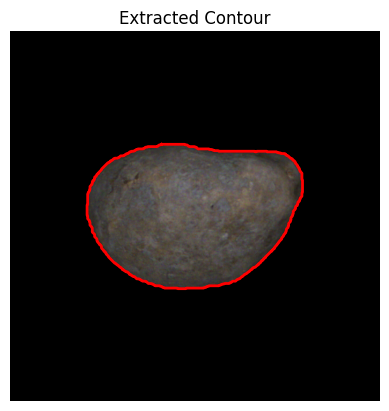

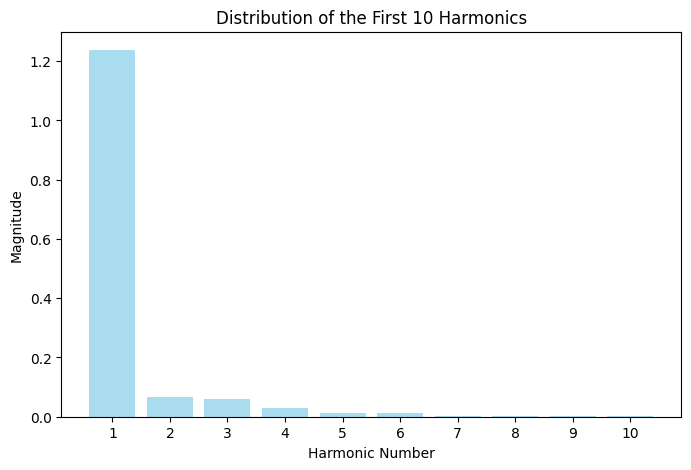

S (computed): 18.981674958466236
S (suggested change): 18.98167465596623
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_114_7.png


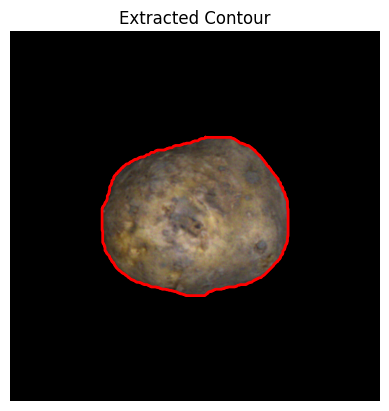

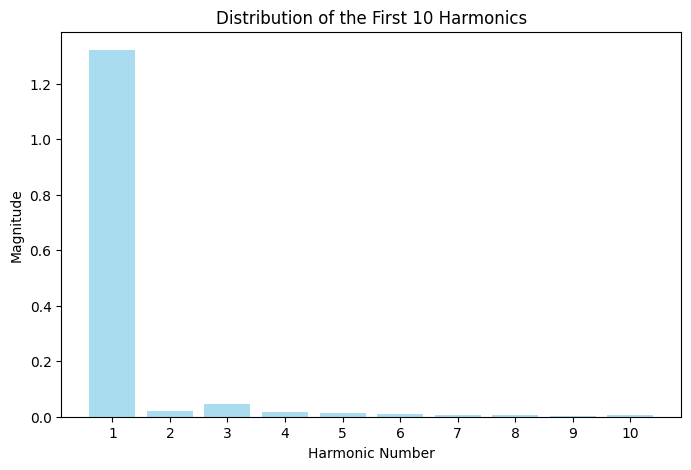

S (computed): 20.589041992926845
S (suggested change): 20.589041690426846
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_120_11.png


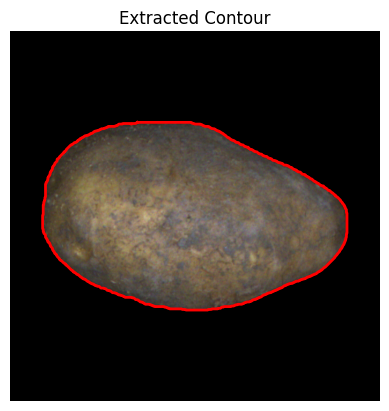

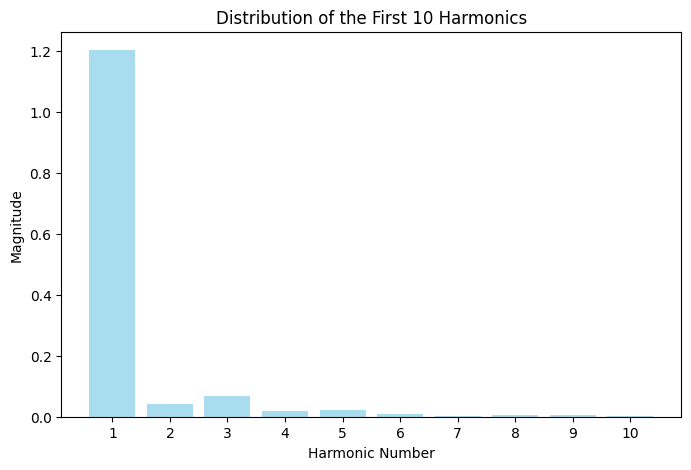

S (computed): 16.606635397300323
S (suggested change): 16.60663509480032
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_126_0.png


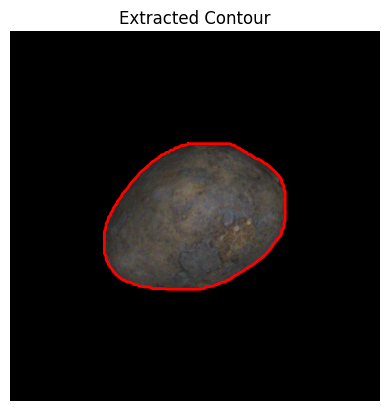

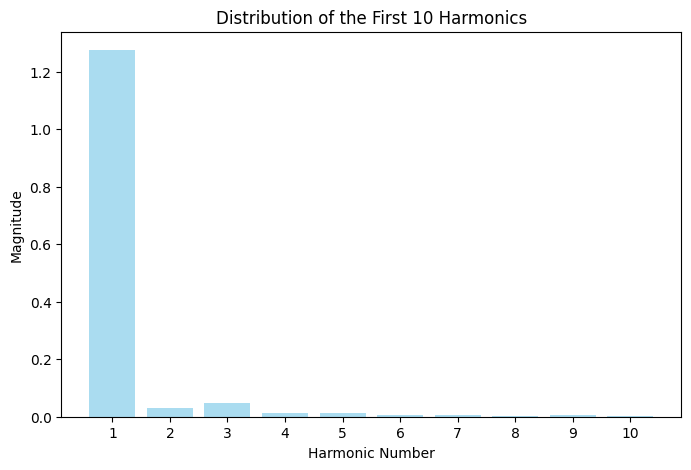

S (computed): 15.528505235270238
S (suggested change): 15.52850493277024
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_126_9.png


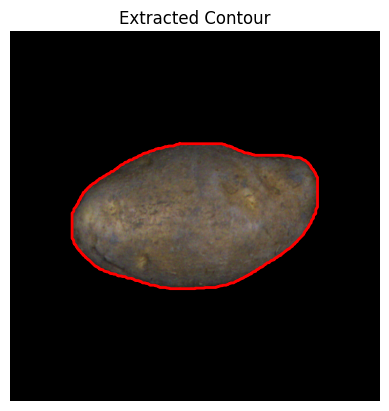

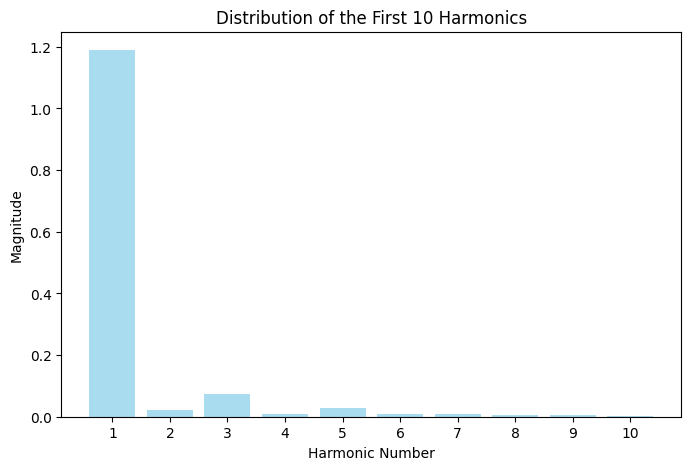

S (computed): 19.27285641577005
S (suggested change): 19.272856113270052
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_114_3.png


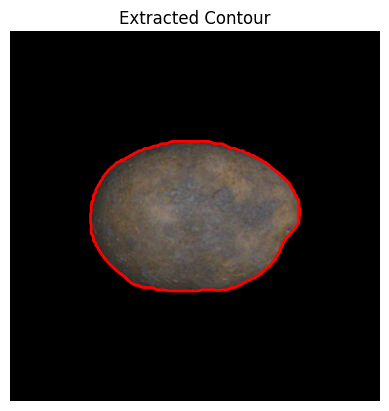

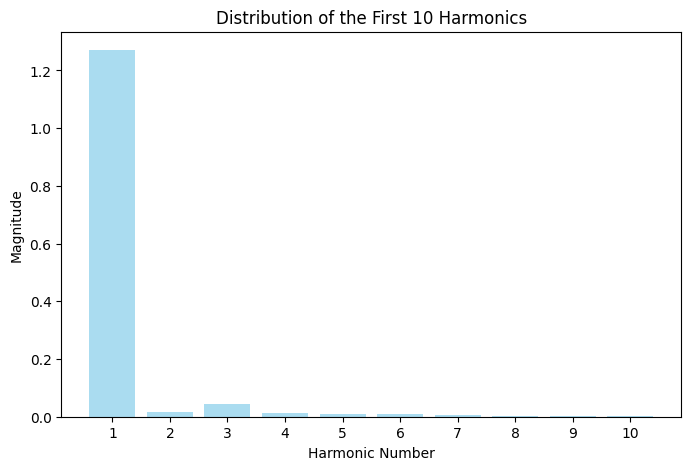

S (computed): 16.384918589595504
S (suggested change): 16.384918287095505
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_102_7.png


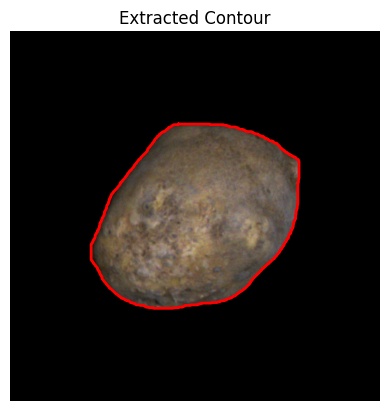

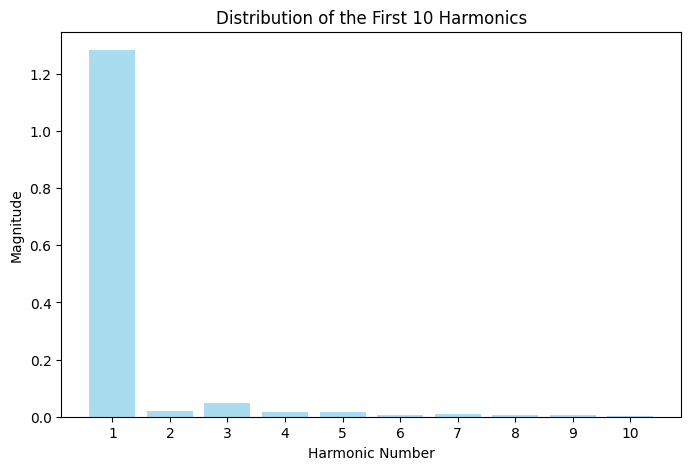

S (computed): 22.918149628932326
S (suggested change): 22.918149326432328
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_108_4.png


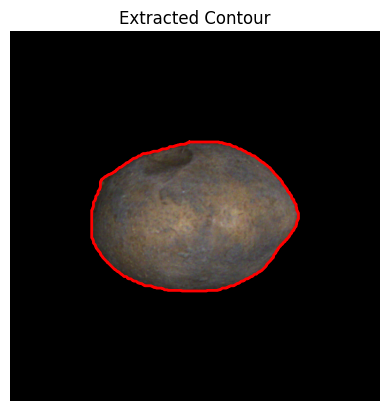

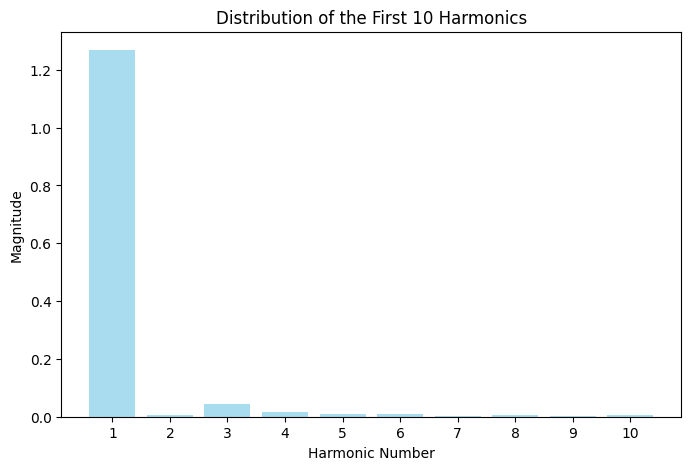

S (computed): 18.03363640662112
S (suggested change): 18.03363610412112
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_128_14.png


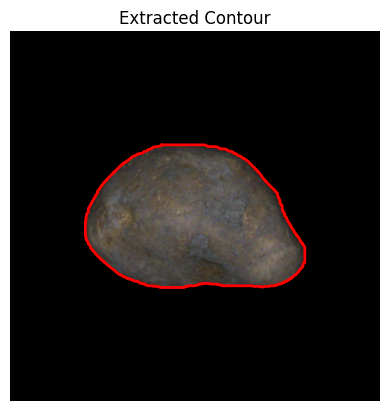

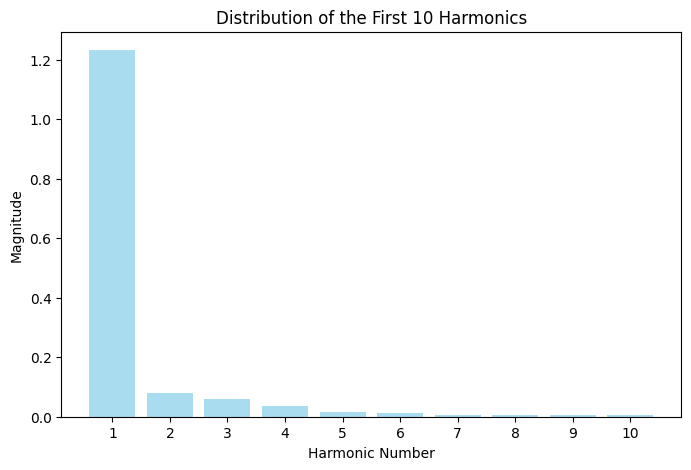

S (computed): 23.282431326363074
S (suggested change): 23.282431023863076
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_122_9.png


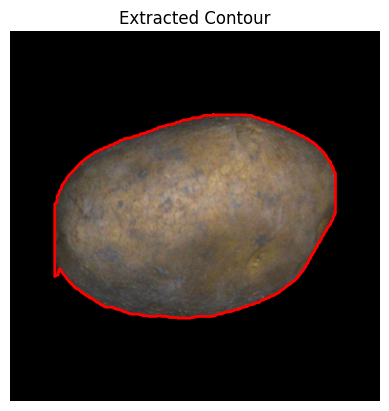

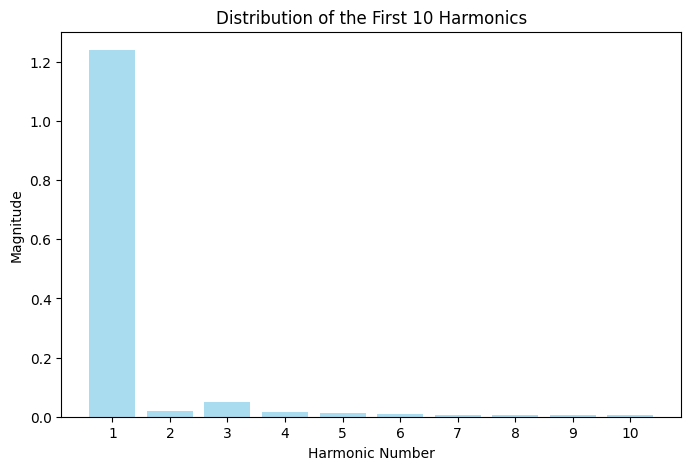

S (computed): 22.521301867609644
S (suggested change): 22.521301565109646
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_116_4.png


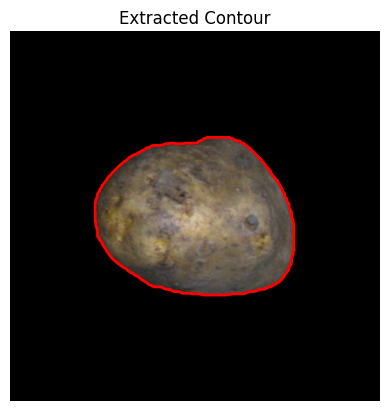

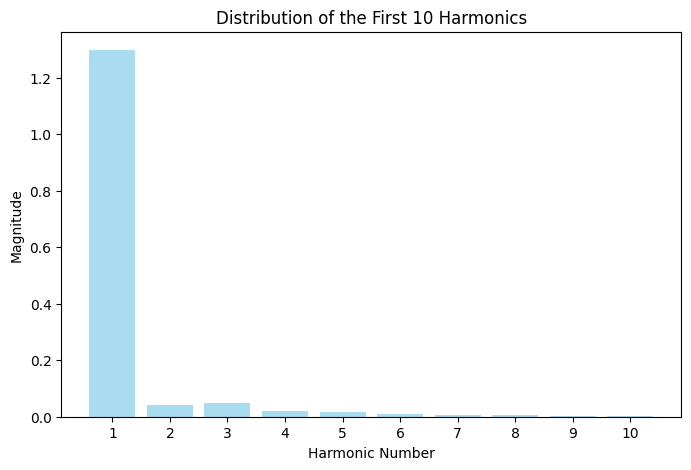

S (computed): 17.71674048696159
S (suggested change): 17.716740184461592
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_122_11.png


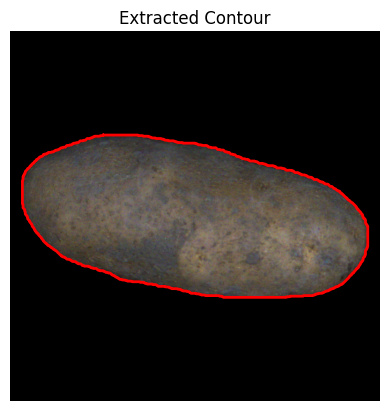

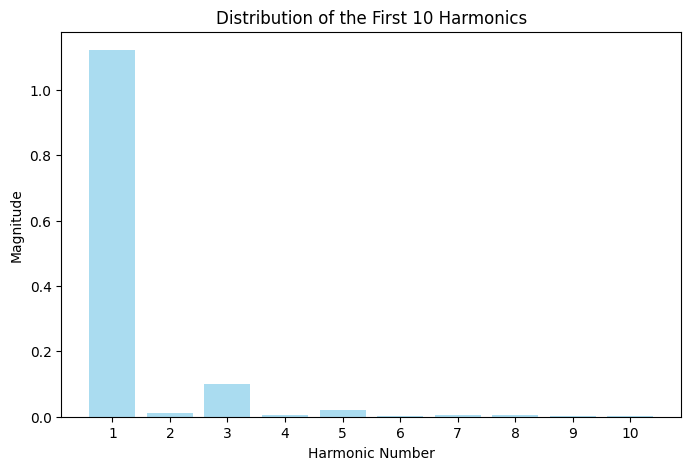

S (computed): 17.405268472922668
S (suggested change): 17.405268170422666
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_106_5.png


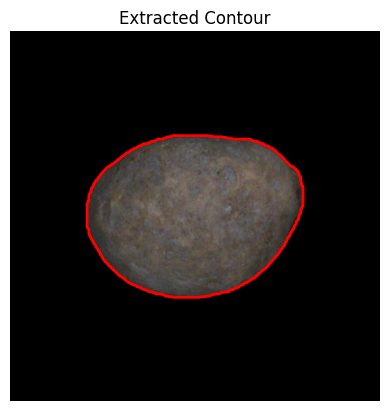

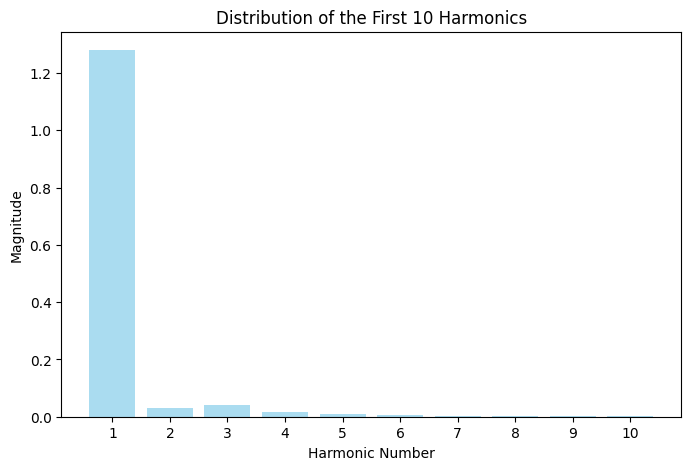

S (computed): 13.384478691954381
S (suggested change): 13.384478389454381
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_124_12.png


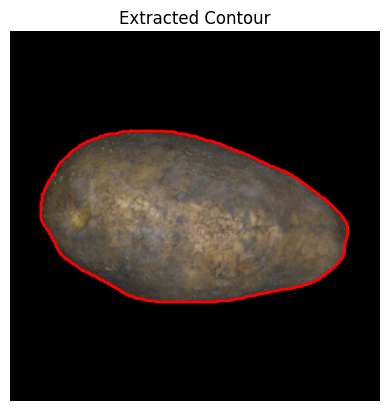

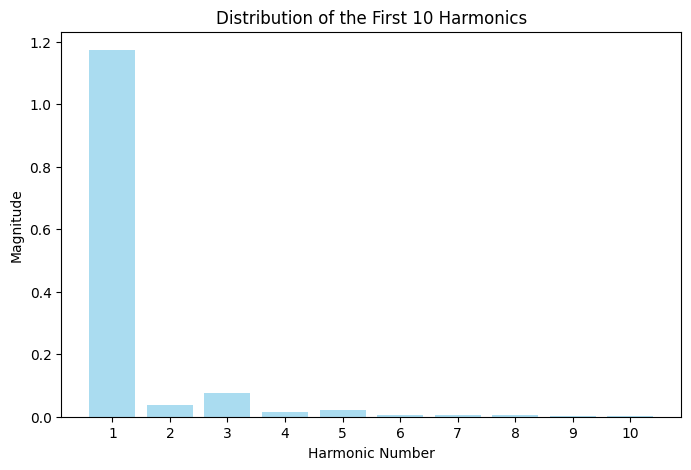

S (computed): 16.734954567613084
S (suggested change): 16.734954265113082
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_118_11.png


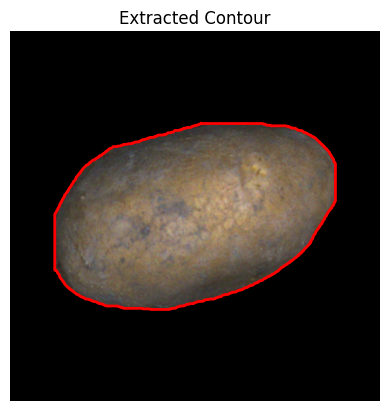

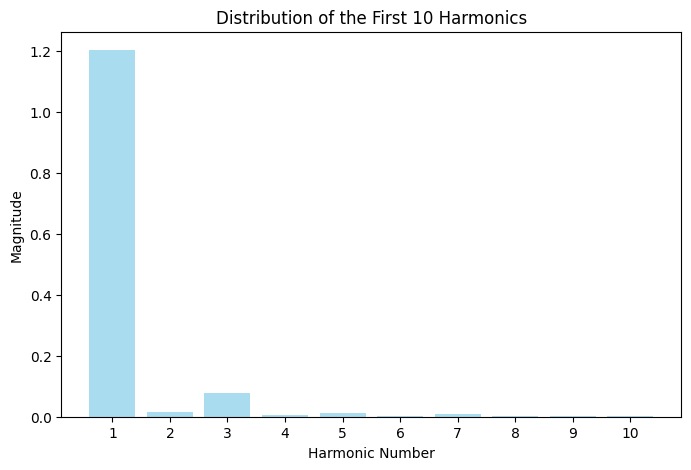

S (computed): 14.707098863301738
S (suggested change): 14.707098560801736
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_112_11.png


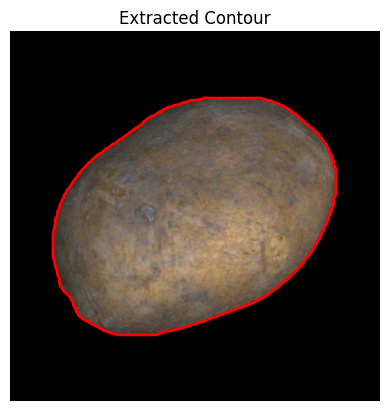

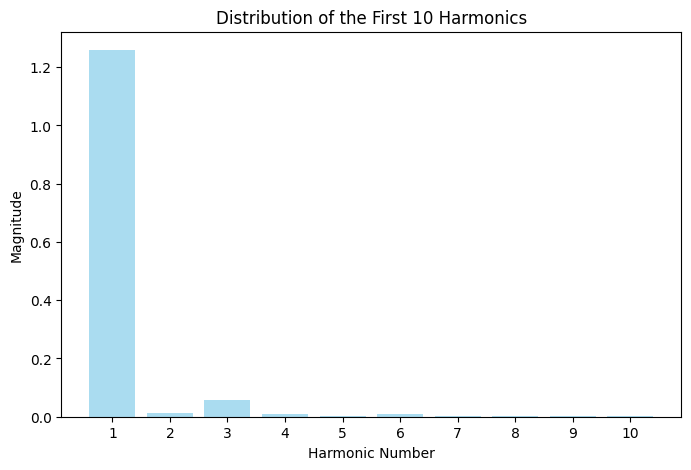

S (computed): 12.495666776226058
S (suggested change): 12.495666473726057
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_130_0.png


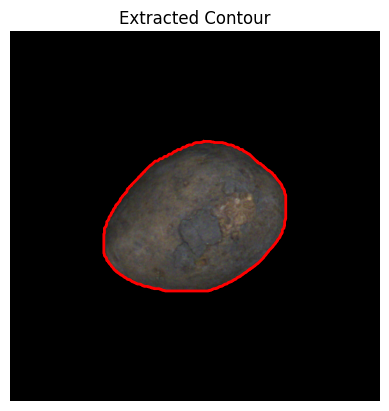

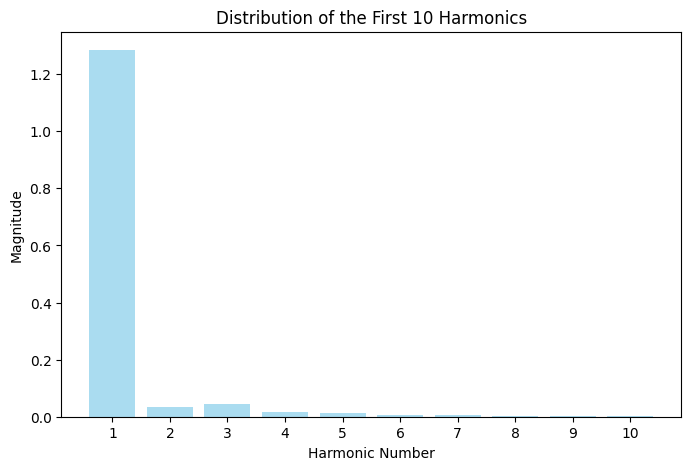

S (computed): 15.282756998978465
S (suggested change): 15.282756696478465
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_128_4.png


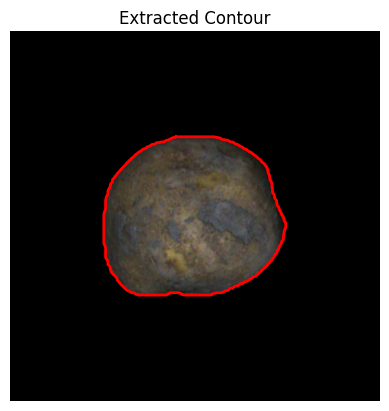

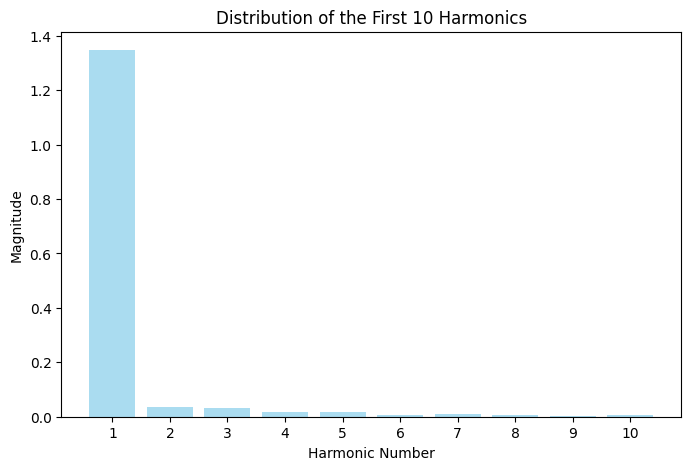

S (computed): 23.629723886140383
S (suggested change): 23.629723583640388
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_112_2.png


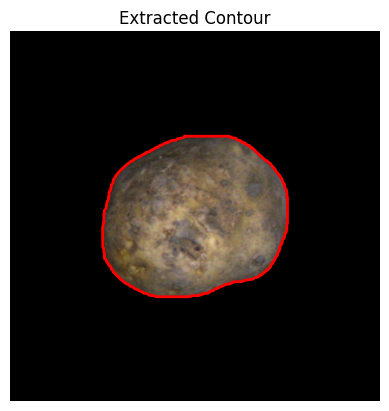

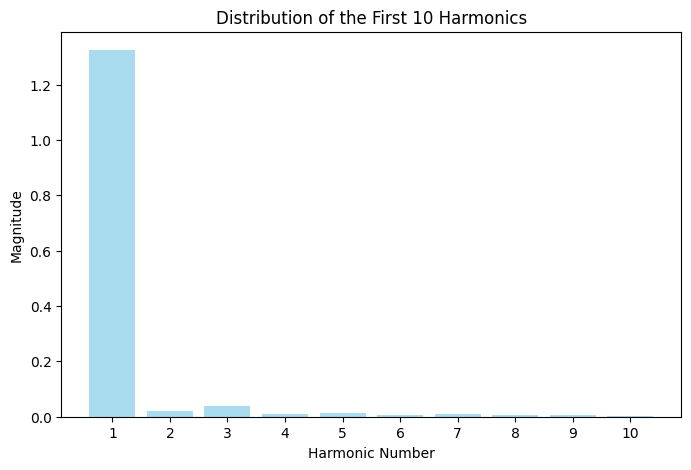

S (computed): 19.652605917739894
S (suggested change): 19.652605615239892
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_130_5.png


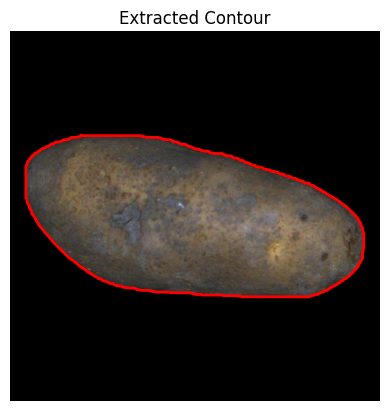

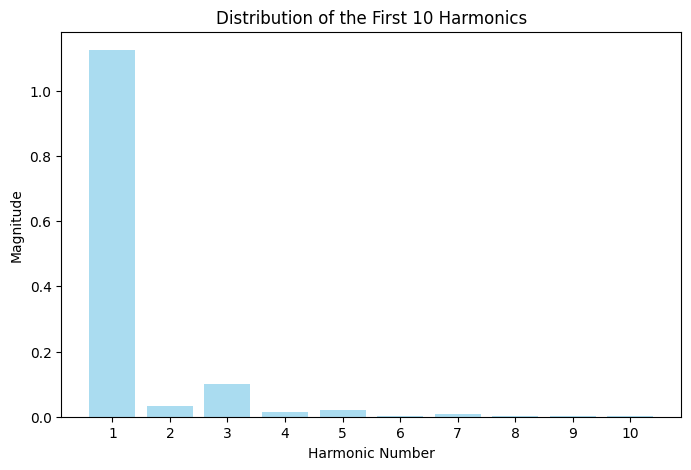

S (computed): 15.89278806076377
S (suggested change): 15.892787758263768
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_126_11.png


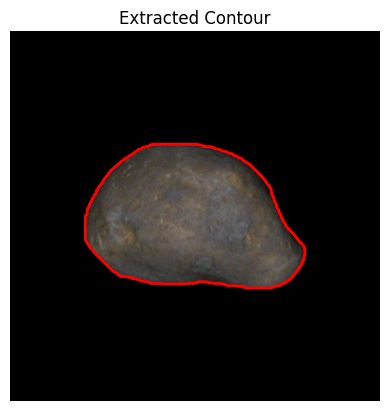

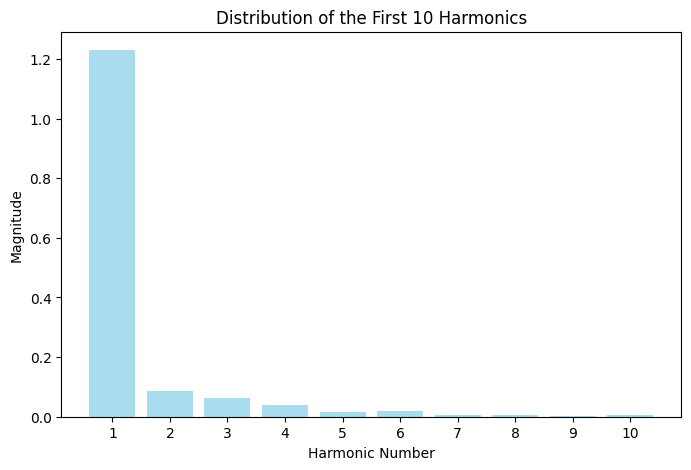

S (computed): 24.425155824833
S (suggested change): 24.425155522333007
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_128_10.png


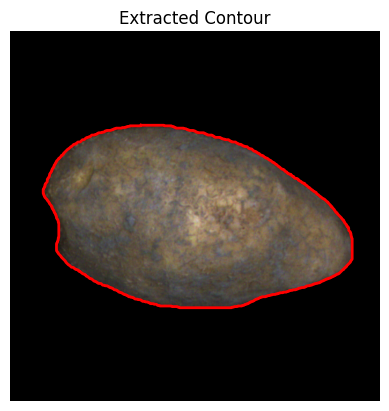

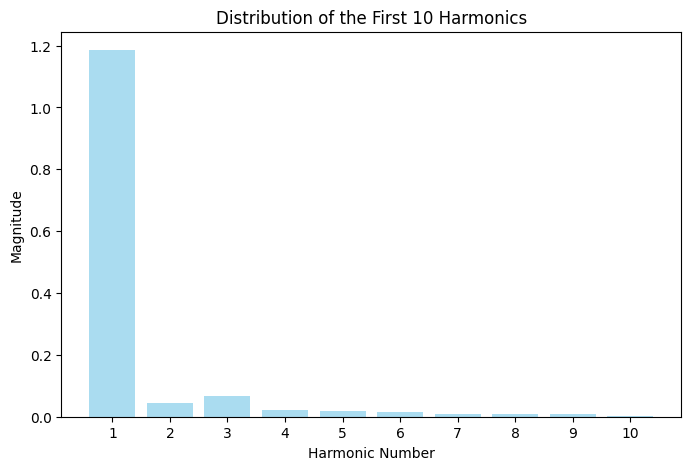

S (computed): 27.169703498701356
S (suggested change): 27.16970319620136
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_120_6.png


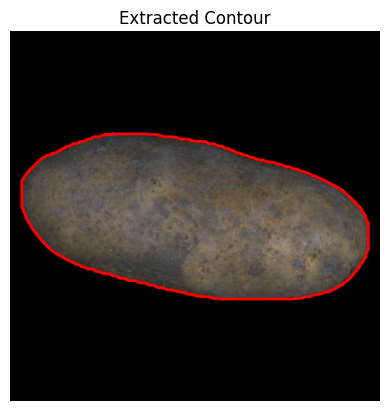

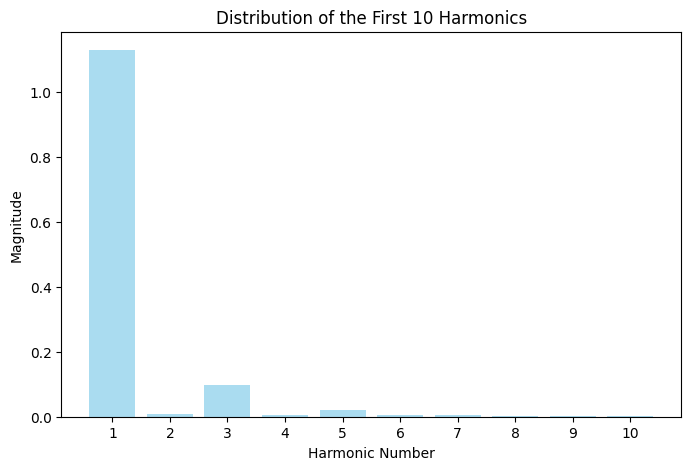

S (computed): 16.144326396903544
S (suggested change): 16.144326094403542
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_102_4.png


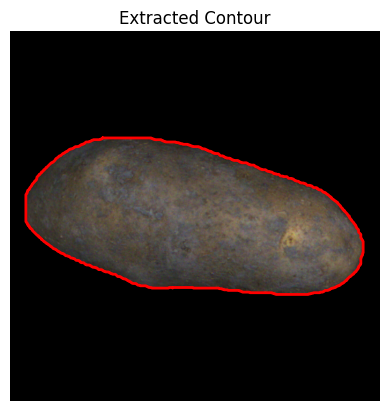

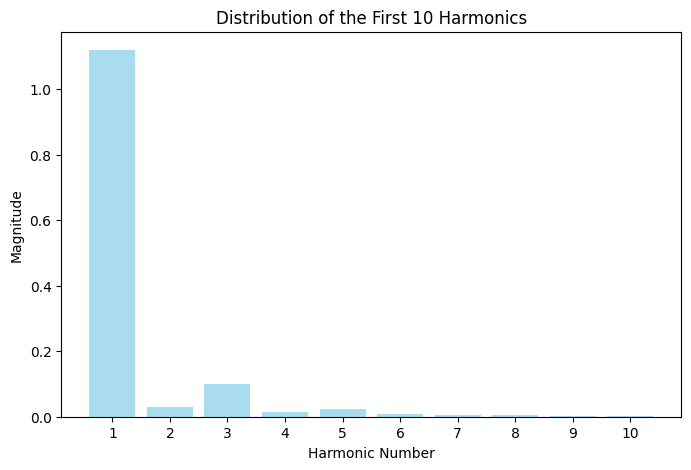

S (computed): 18.202346923089756
S (suggested change): 18.202346620589758
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_102_0.png


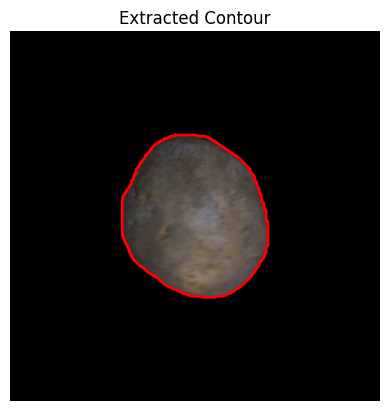

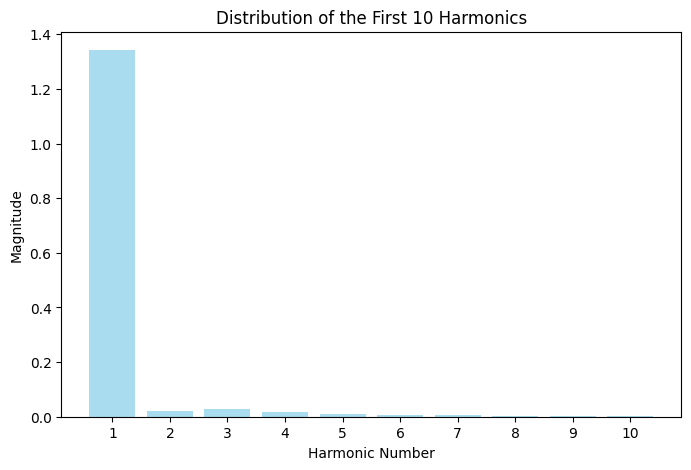

S (computed): 14.870282986258928
S (suggested change): 14.870282683758928
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_118_10.png


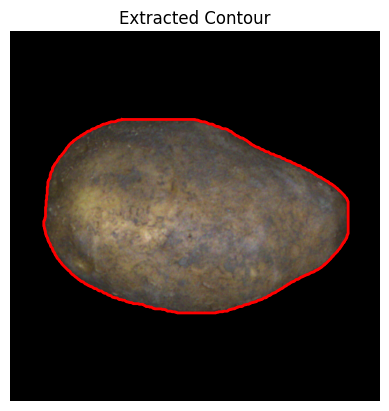

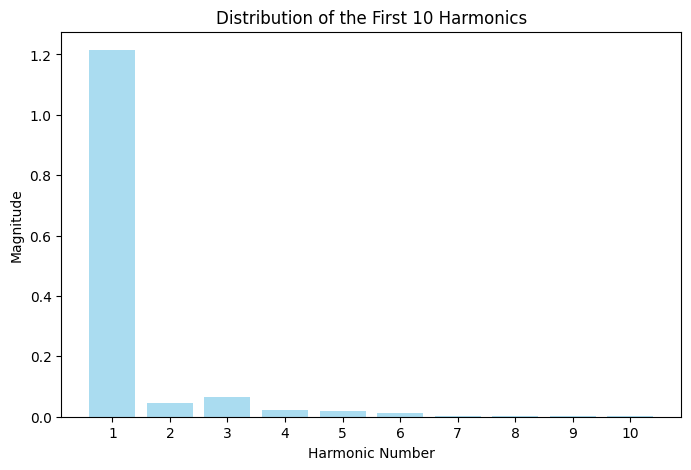

S (computed): 16.881943658275414
S (suggested change): 16.881943355775412
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_132_10.png


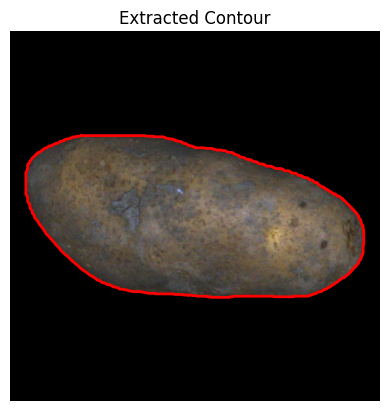

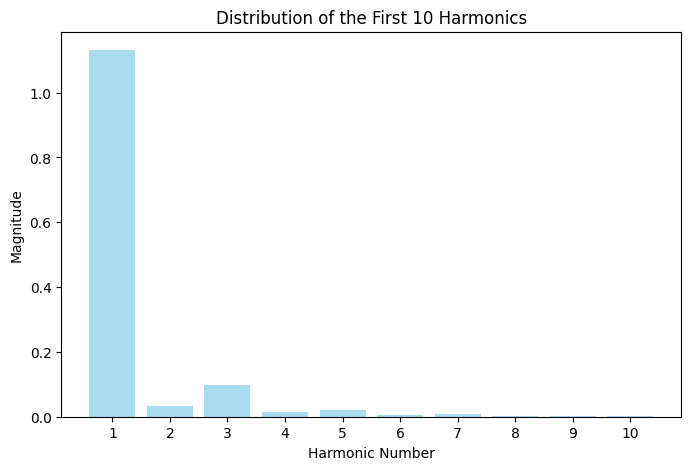

S (computed): 17.11708826219465
S (suggested change): 17.11708795969465
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_104_8.png


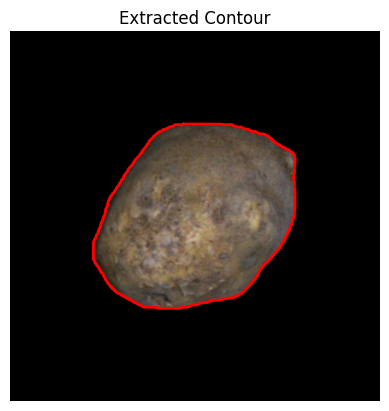

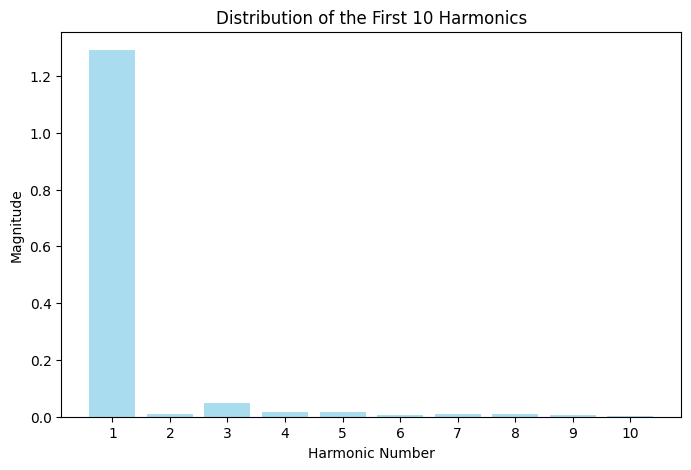

S (computed): 23.992989545205525
S (suggested change): 23.992989242705523
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_132_0.png


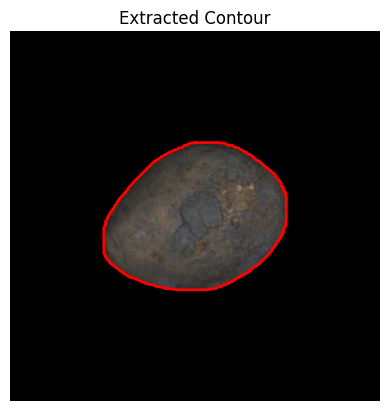

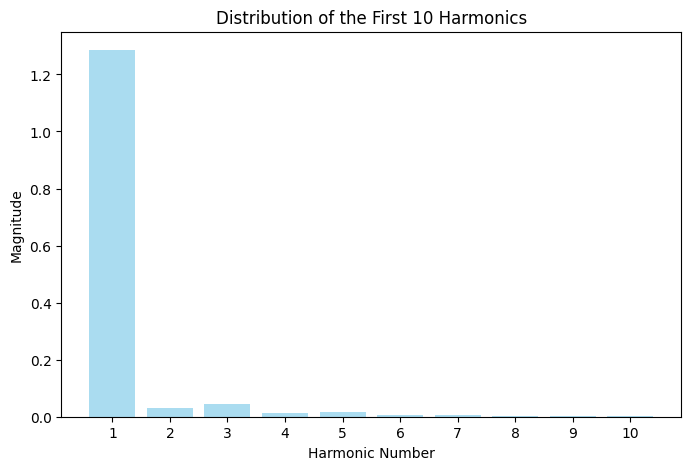

S (computed): 13.653060304353328
S (suggested change): 13.65306000185333
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_116_5.png


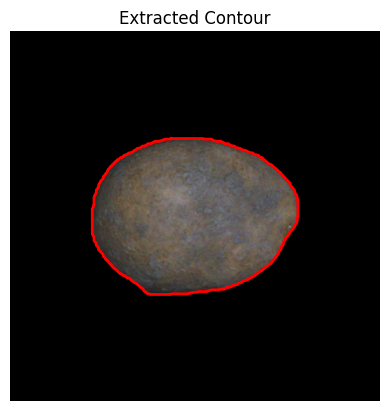

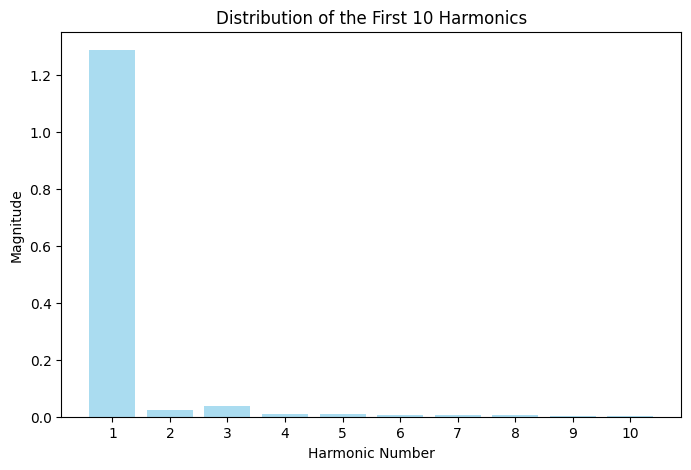

S (computed): 16.7802130432932
S (suggested change): 16.780212740793203
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_114_0.png


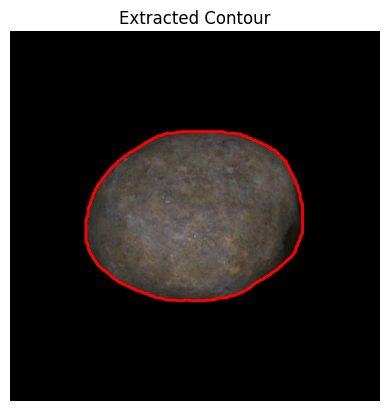

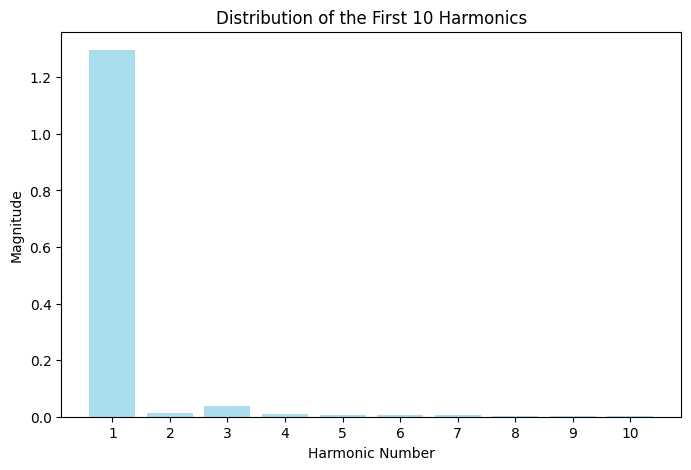

S (computed): 12.483368755466302
S (suggested change): 12.483368452966303
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_120_8.png


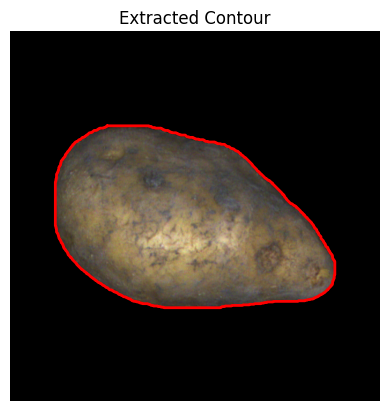

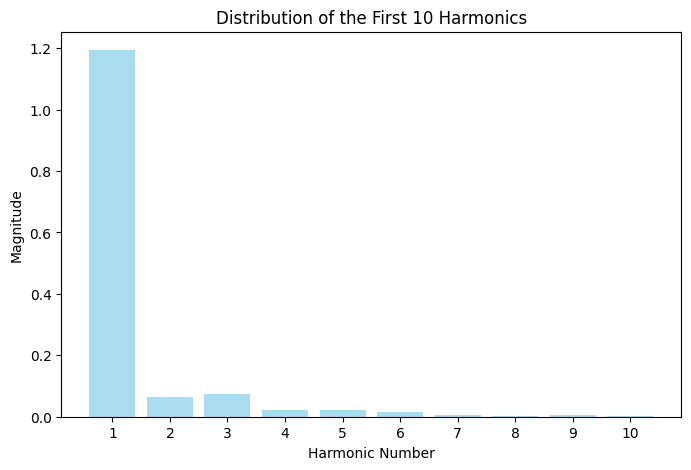

S (computed): 22.022295982202856
S (suggested change): 22.022295679702857
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_106_0.png


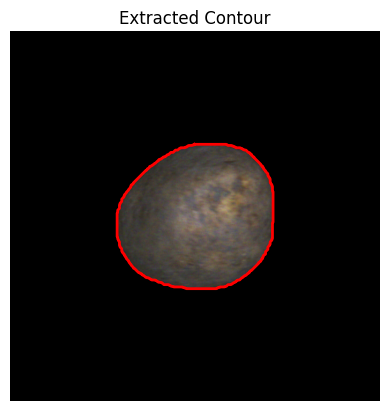

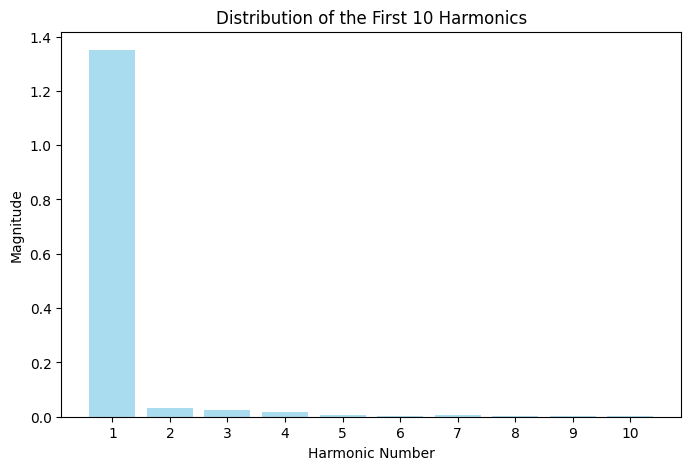

S (computed): 12.257050400025893
S (suggested change): 12.257050097525894
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_110_9.png


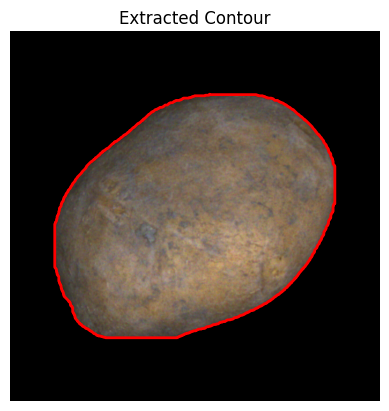

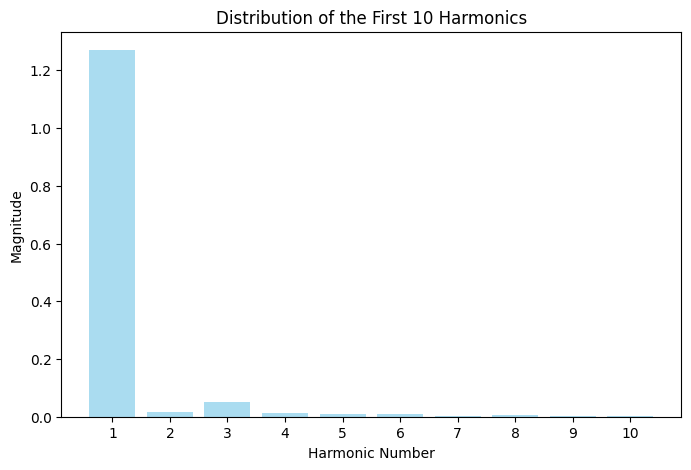

S (computed): 15.772595334273678
S (suggested change): 15.77259503177368
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_106_7.png


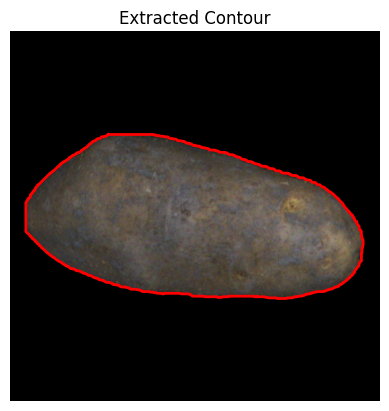

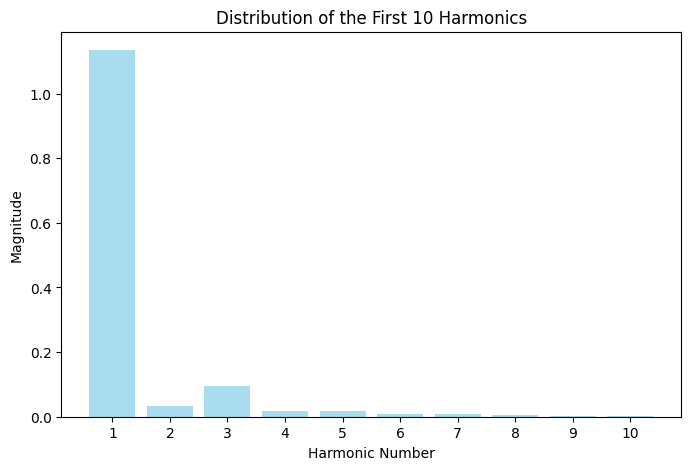

S (computed): 18.158497097355582
S (suggested change): 18.15849679485558
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_104_1.png


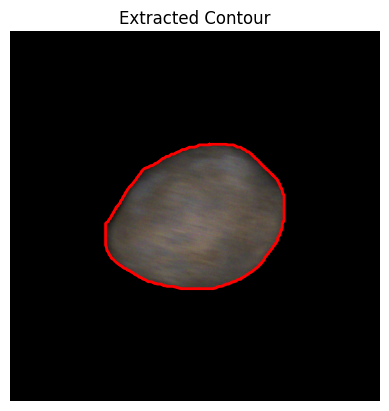

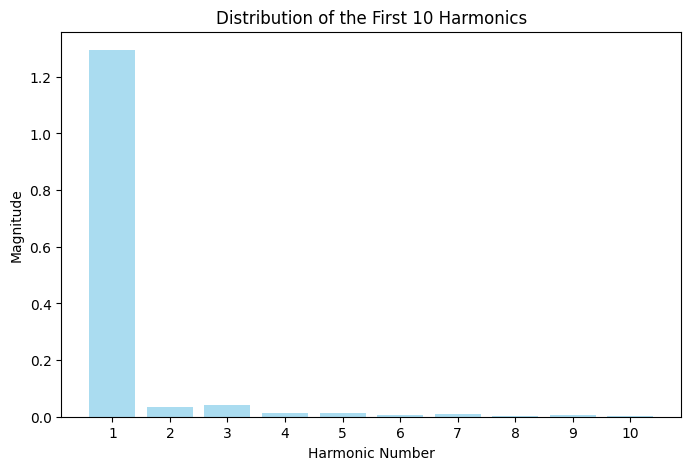

S (computed): 16.891624584406912
S (suggested change): 16.89162428190691
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_126_12.png


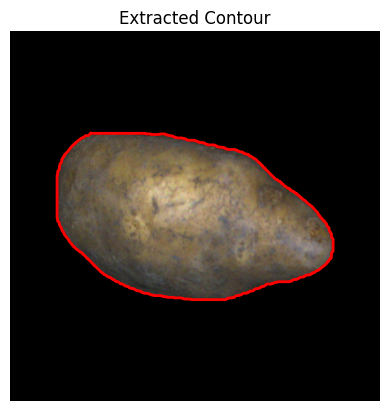

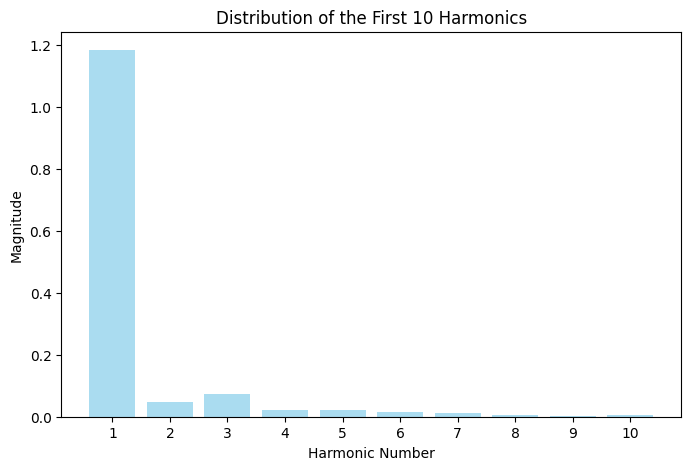

S (computed): 23.623618342398437
S (suggested change): 23.62361803989844
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_120_2.png


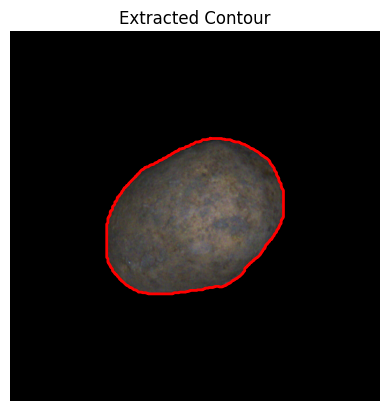

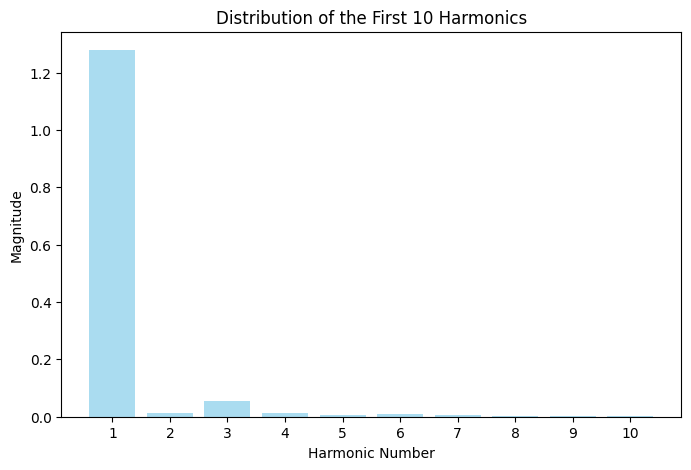

S (computed): 14.783896982262236
S (suggested change): 14.783896679762236
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_120_1.png


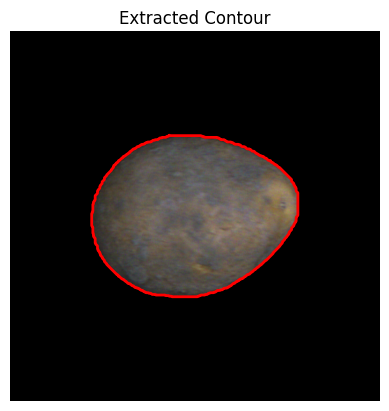

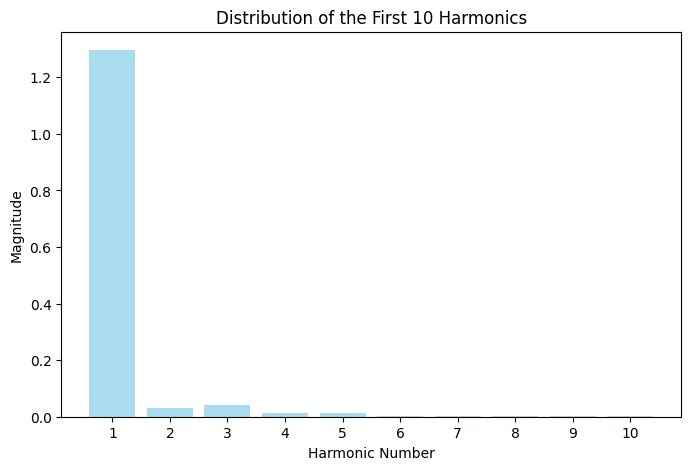

S (computed): 10.694814363994071
S (suggested change): 10.694814061494068
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_100_6.png


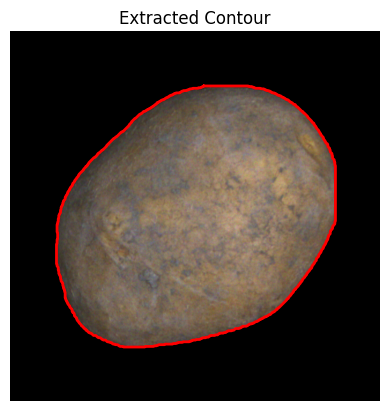

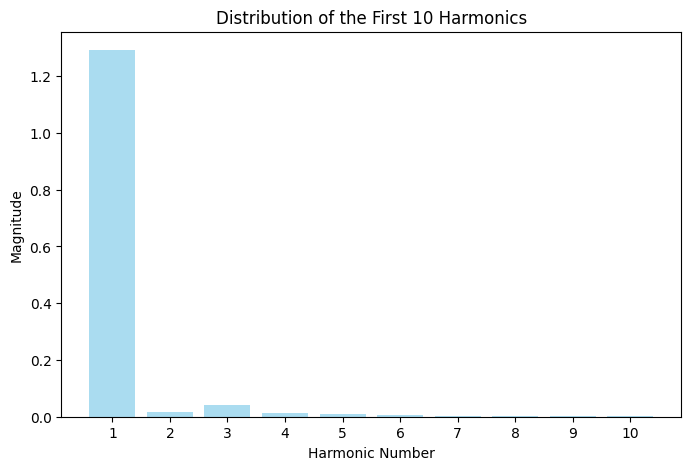

S (computed): 12.674943758462168
S (suggested change): 12.674943455962168
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_100_3.png


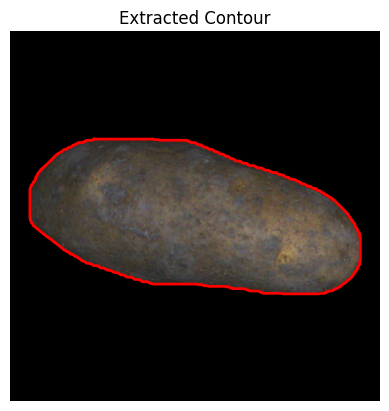

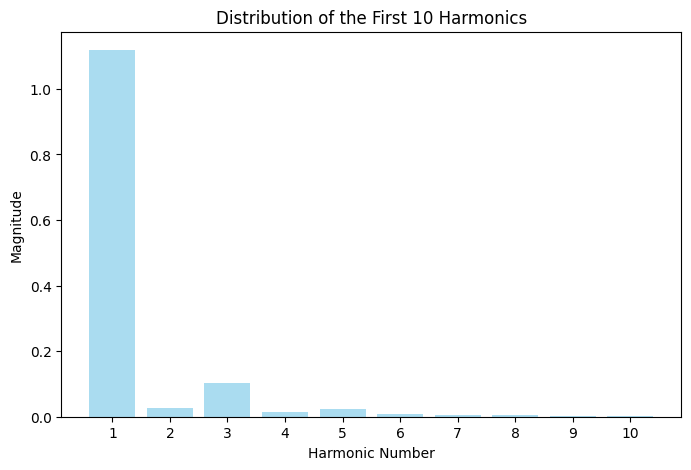

S (computed): 18.203196118014652
S (suggested change): 18.20319581551465
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_114_13.png


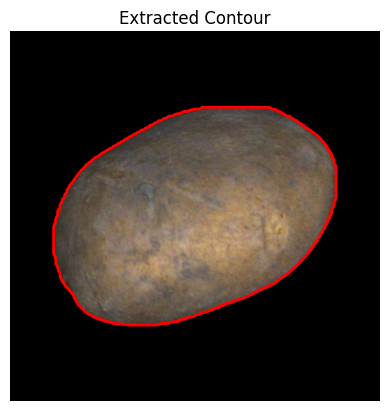

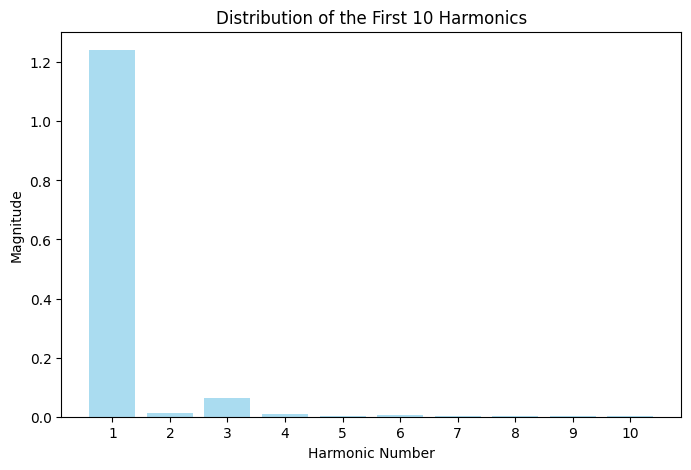

S (computed): 12.740219592635295
S (suggested change): 12.740219290135295
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_110_0.png


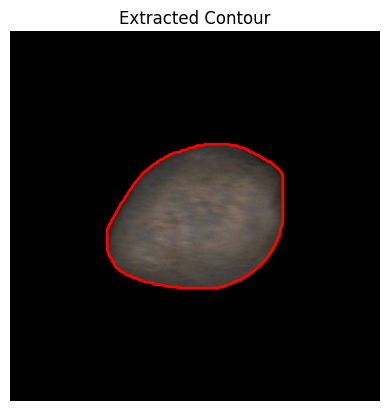

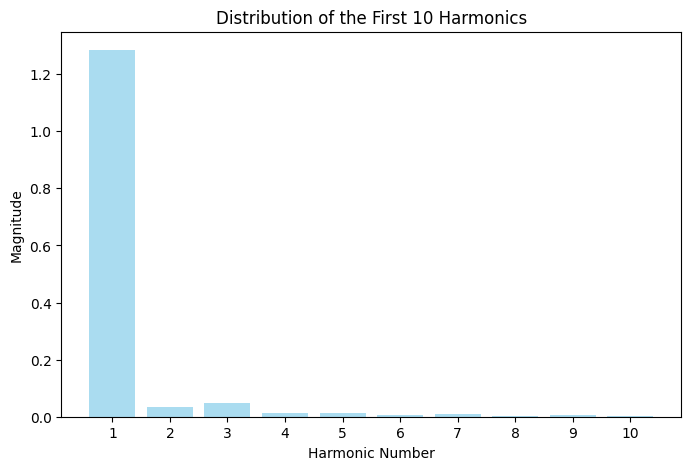

S (computed): 18.112419370549617
S (suggested change): 18.11241906804962
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_112_7.png


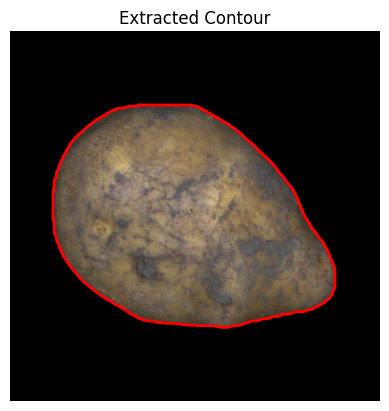

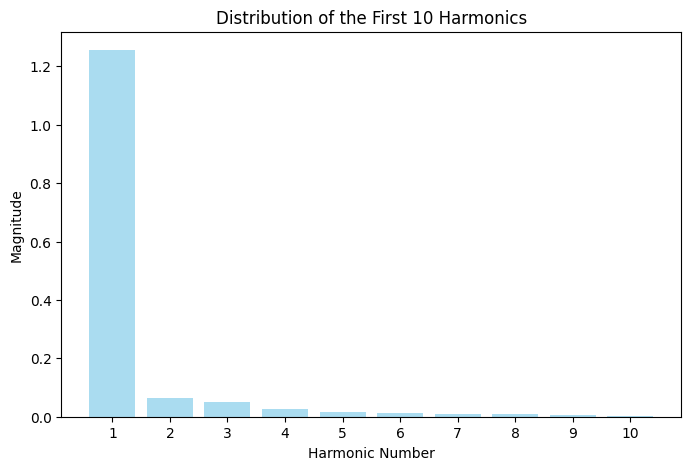

S (computed): 23.782420547137782
S (suggested change): 23.782420244637784
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_104_6.png


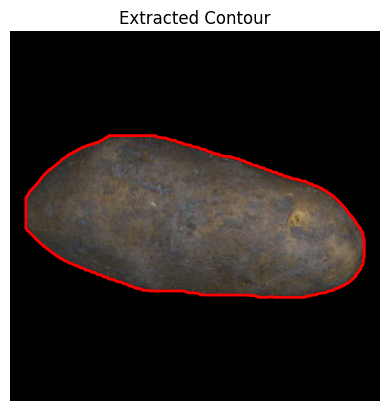

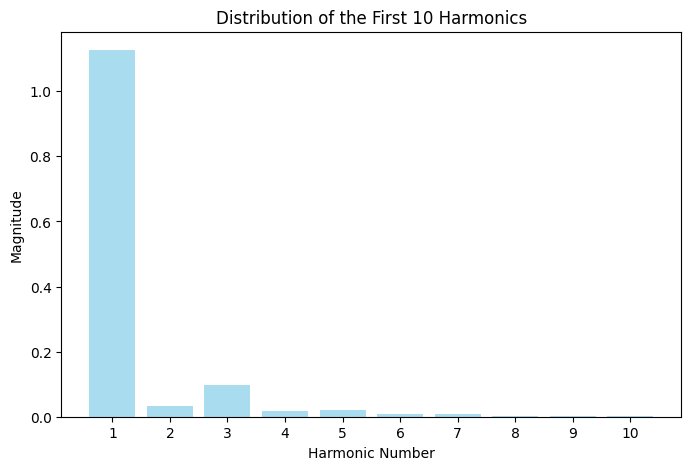

S (computed): 17.204270274859876
S (suggested change): 17.204269972359878
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_124_10.png


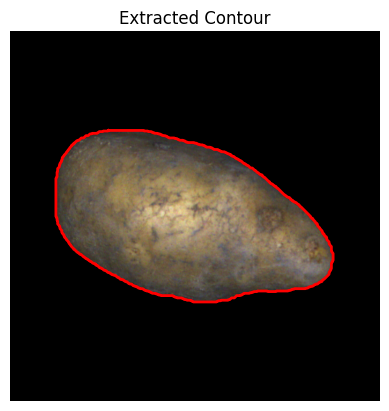

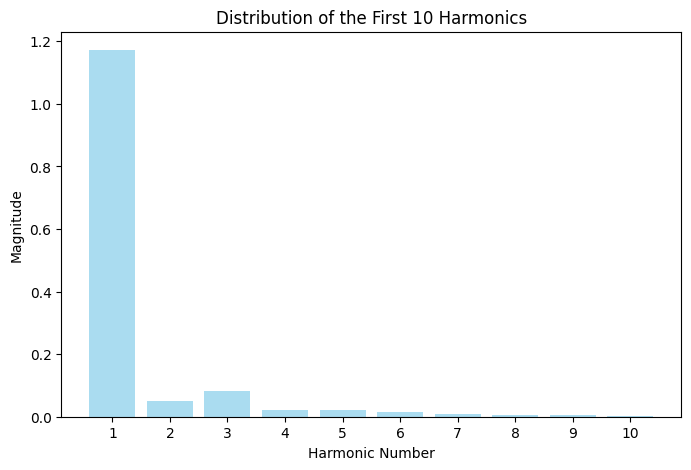

S (computed): 20.300352738929178
S (suggested change): 20.300352436429183
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_118_0.png


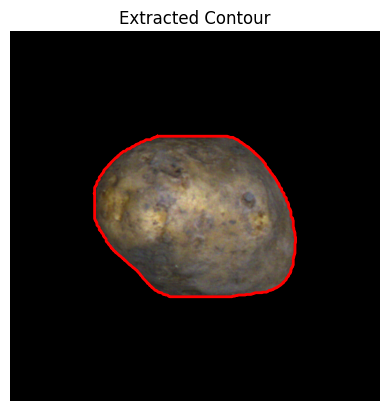

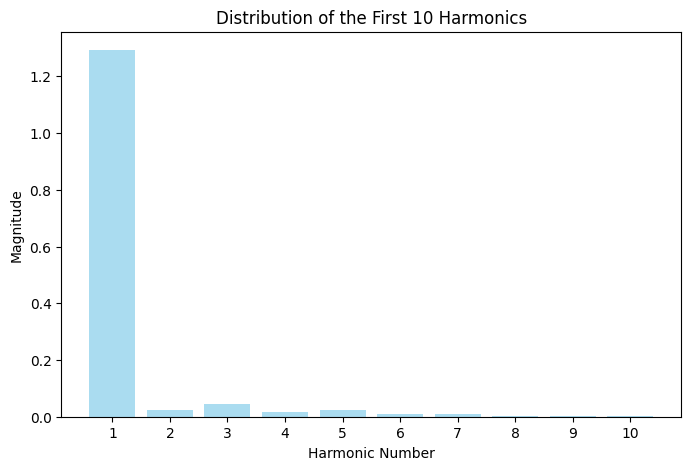

S (computed): 18.350689213444905
S (suggested change): 18.350688910944903
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_118_1.png


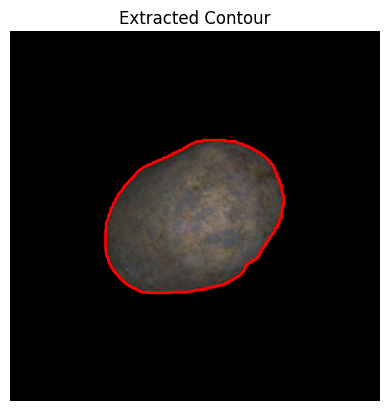

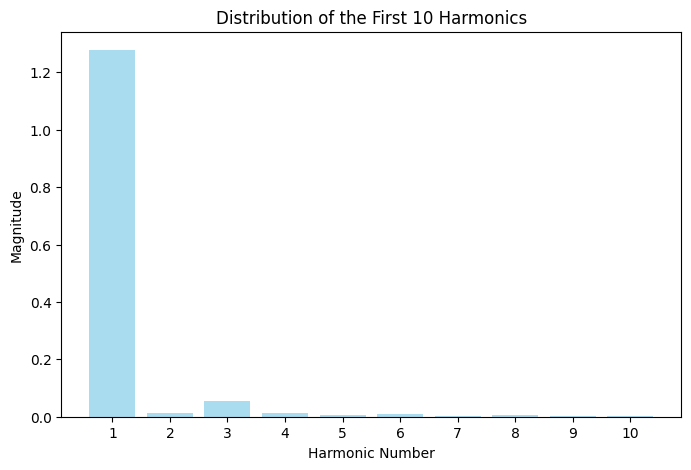

S (computed): 14.564516093431894
S (suggested change): 14.564515790931894
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_112_4.png


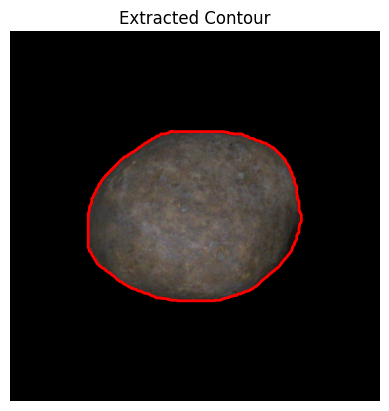

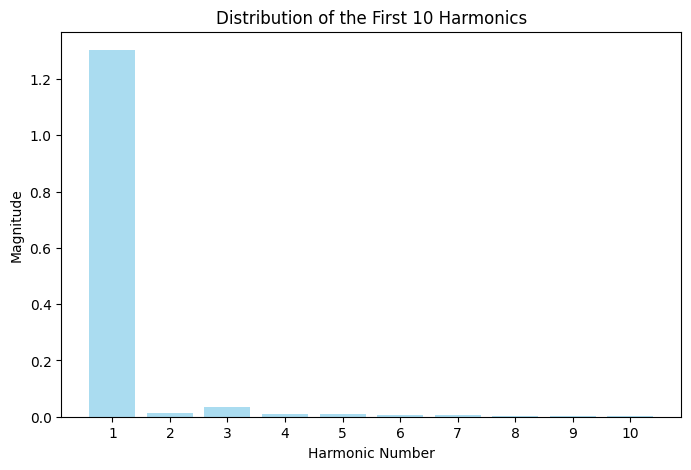

S (computed): 14.26118663295818
S (suggested change): 14.261186330458182
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_110_2.png


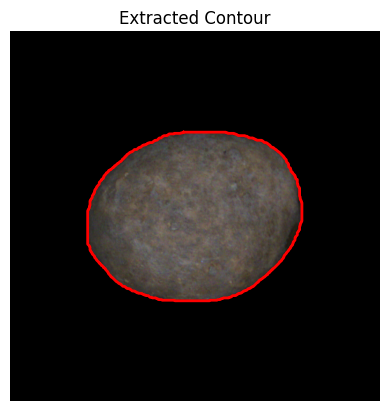

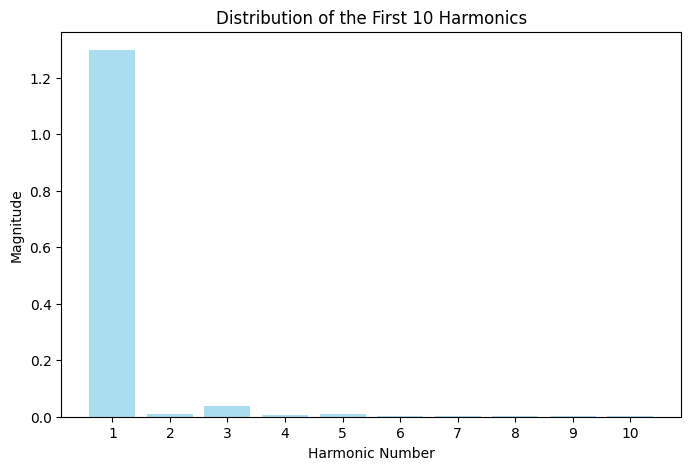

S (computed): 9.977046866176138
S (suggested change): 9.97704656367614
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_102_6.png


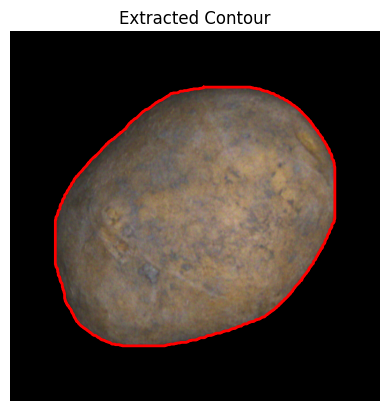

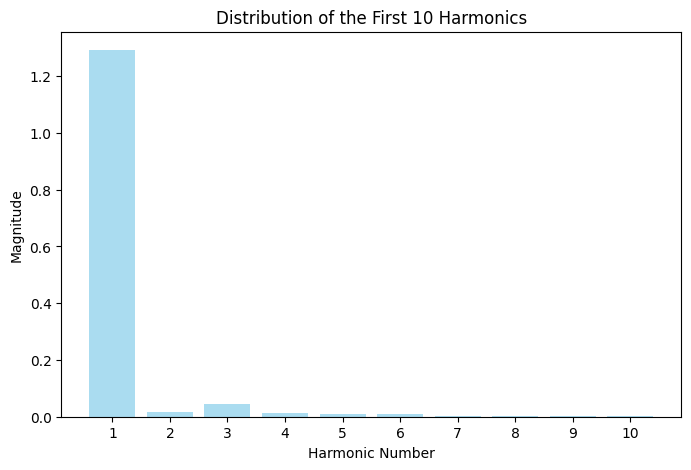

S (computed): 13.951157956847148
S (suggested change): 13.951157654347147
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_122_12.png


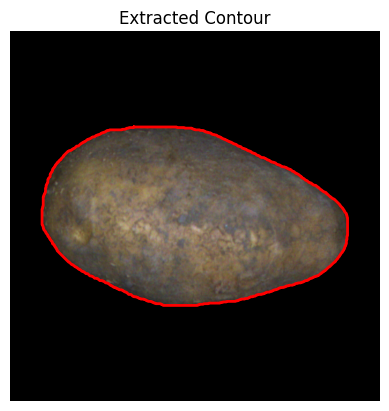

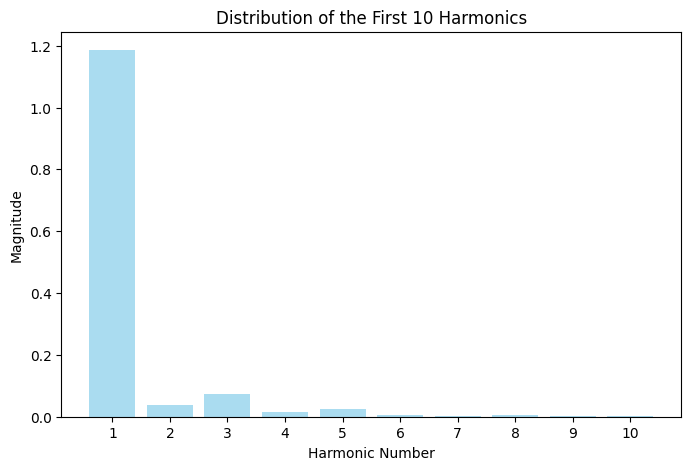

S (computed): 16.272315416715287
S (suggested change): 16.27231511421529
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_108_7.png


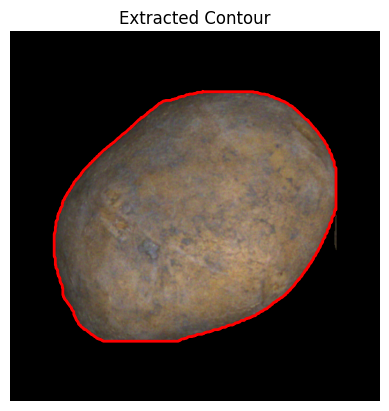

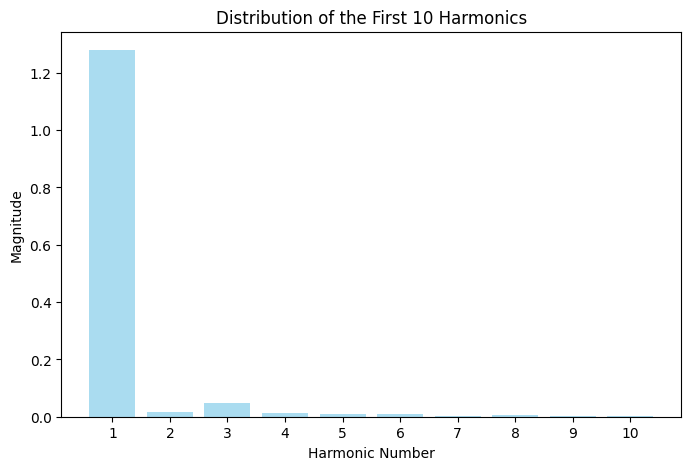

S (computed): 15.237275211806134
S (suggested change): 15.237274909306134
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_122_8.png


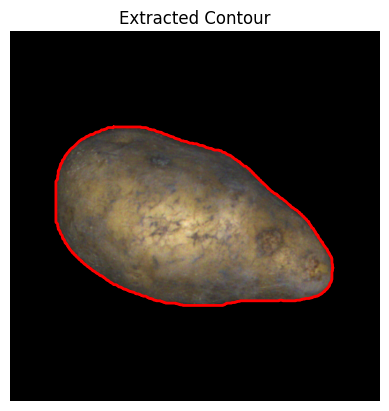

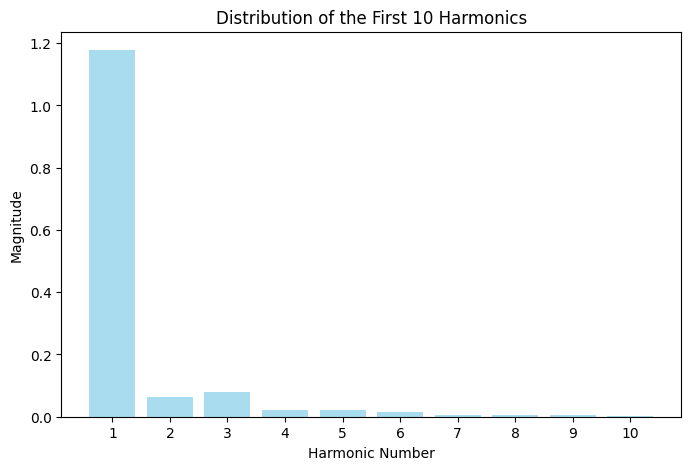

S (computed): 21.56319151872794
S (suggested change): 21.563191216227946
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_124_1.png


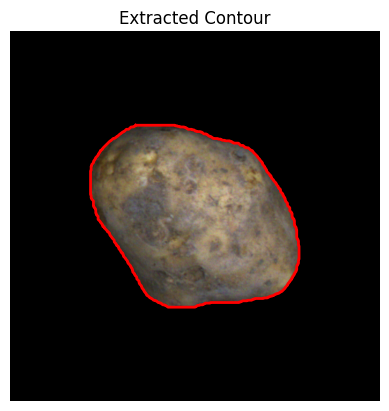

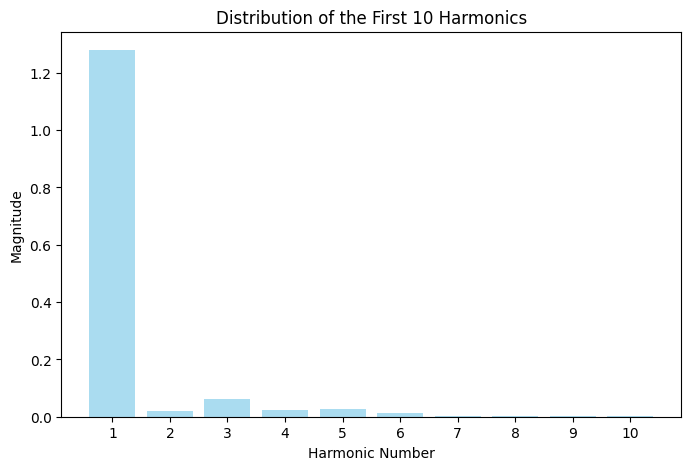

S (computed): 21.60022962211034
S (suggested change): 21.600229319610342
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_126_13.png


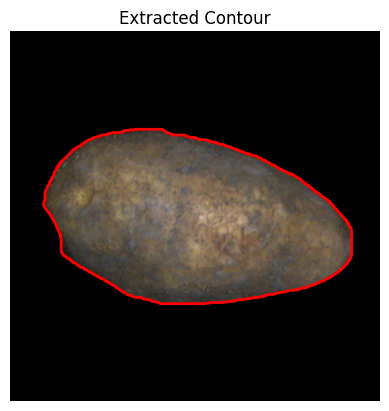

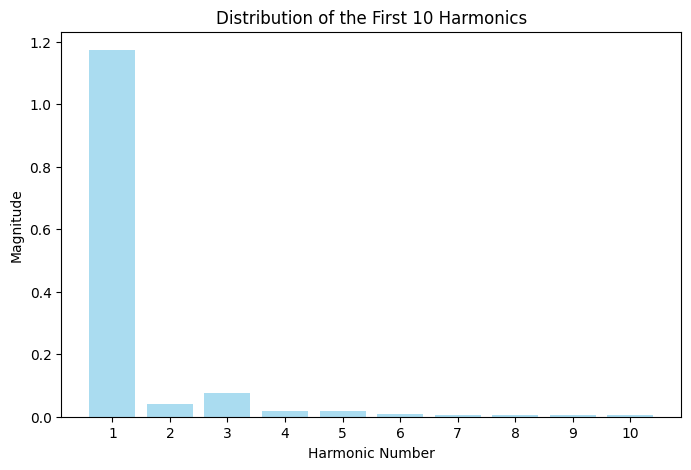

S (computed): 22.175478187452903
S (suggested change): 22.175477884952905
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_106_2.png


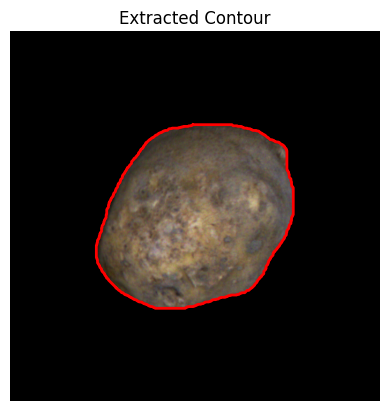

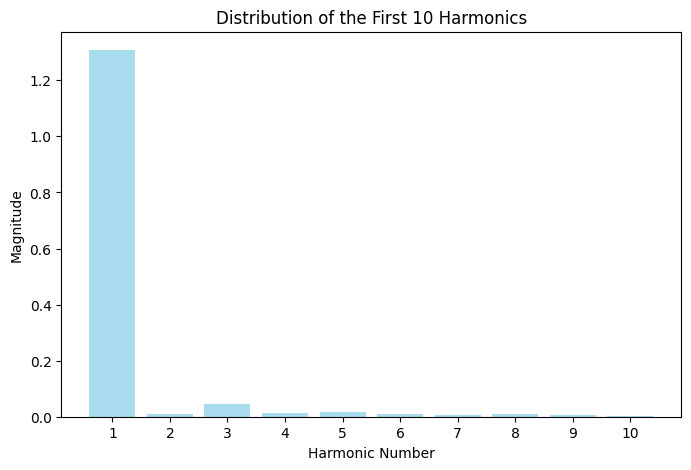

S (computed): 23.435540836464803
S (suggested change): 23.4355405339648
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_114_10.png


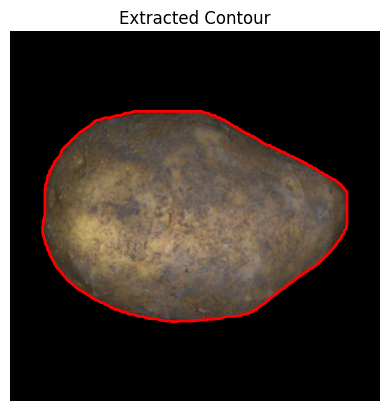

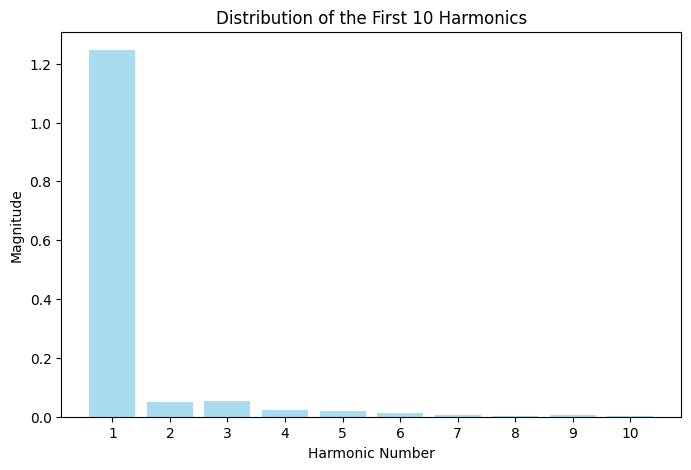

S (computed): 19.409266058744908
S (suggested change): 19.409265756244906
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_118_6.png


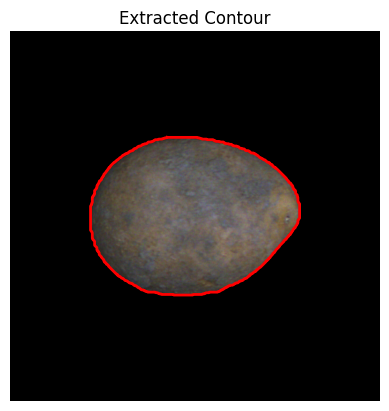

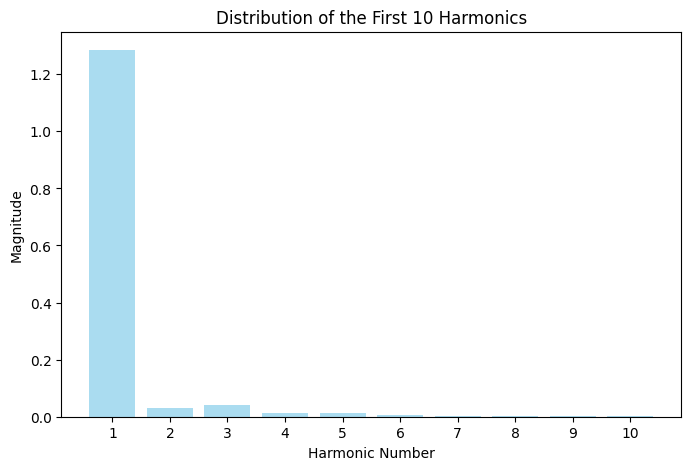

S (computed): 12.362656191719585
S (suggested change): 12.362655889219585
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_126_10.png


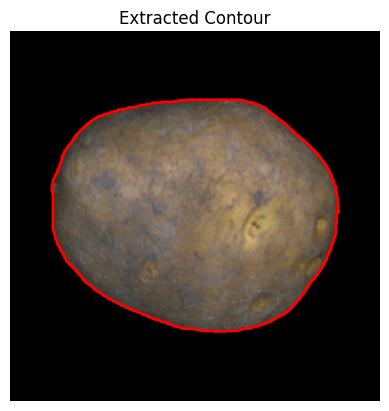

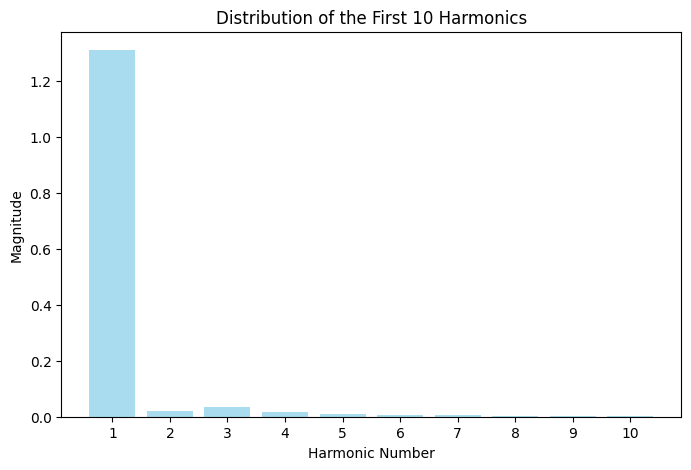

S (computed): 14.23891245238723
S (suggested change): 14.238912149887229
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_106_4.png


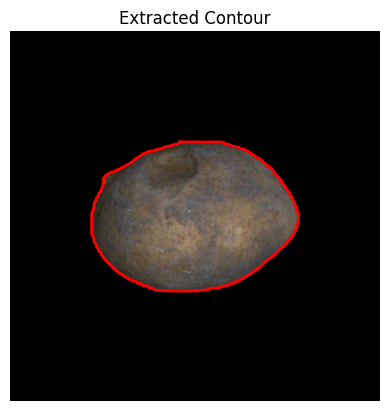

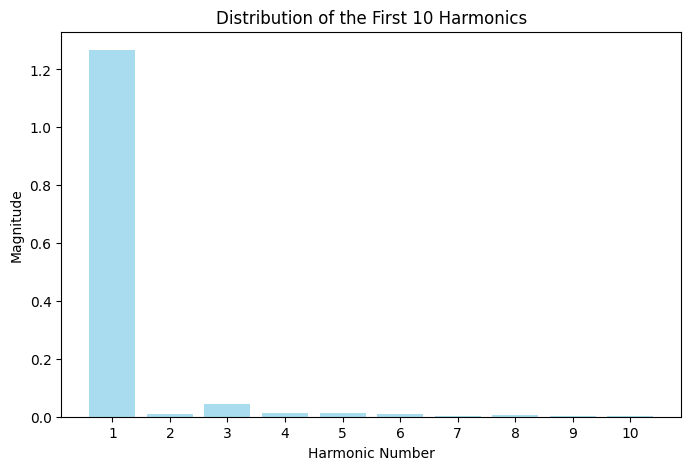

S (computed): 15.33543353251256
S (suggested change): 15.33543323001256
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_130_7.png


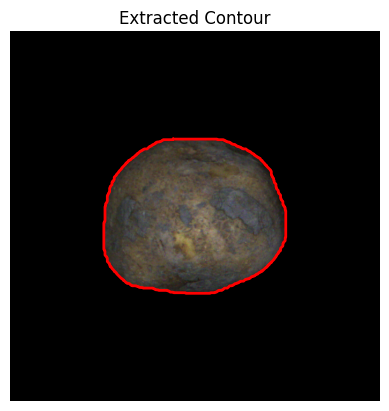

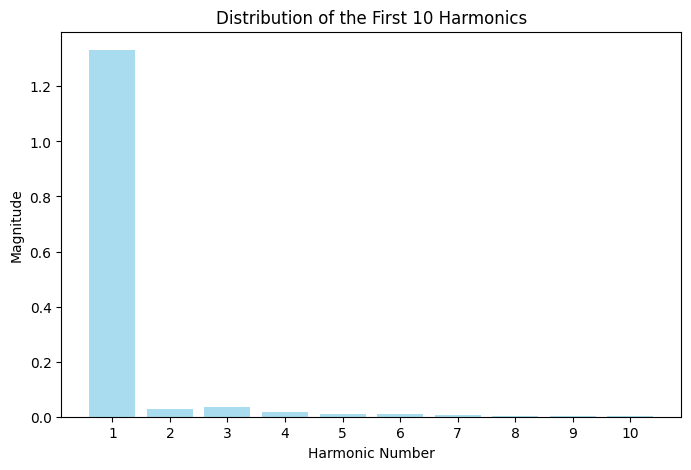

S (computed): 16.072516712376625
S (suggested change): 16.072516409876624
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_112_8.png


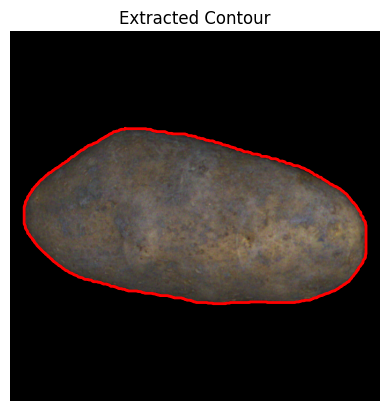

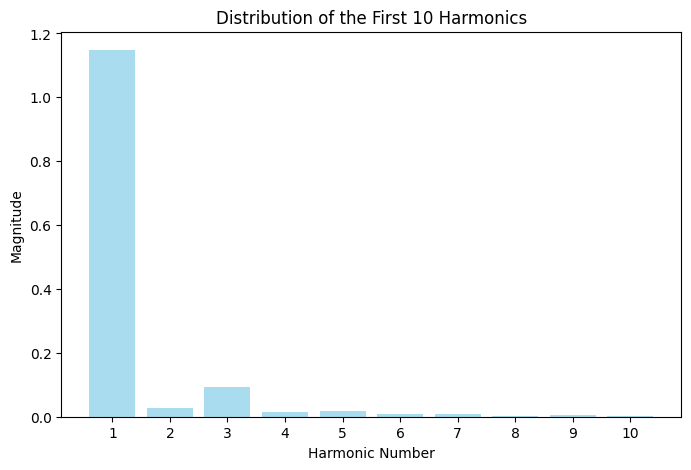

S (computed): 18.723669471648037
S (suggested change): 18.723669169148035
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_114_5.png


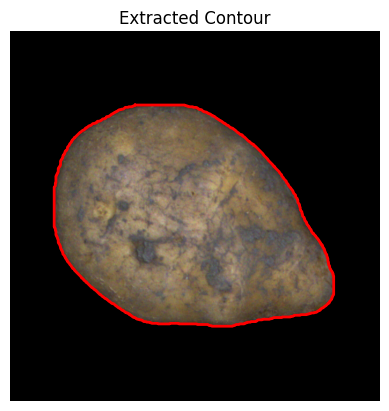

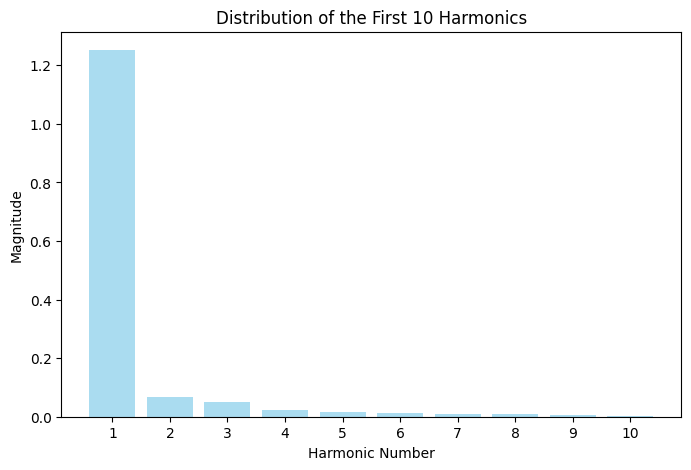

S (computed): 23.965489850359774
S (suggested change): 23.965489547859775
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_128_6.png


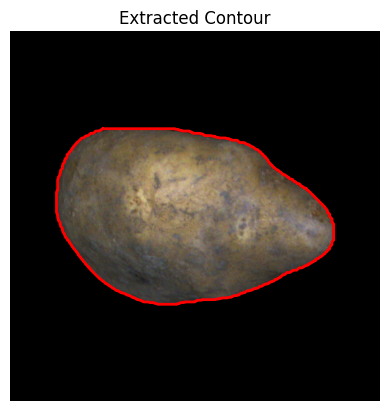

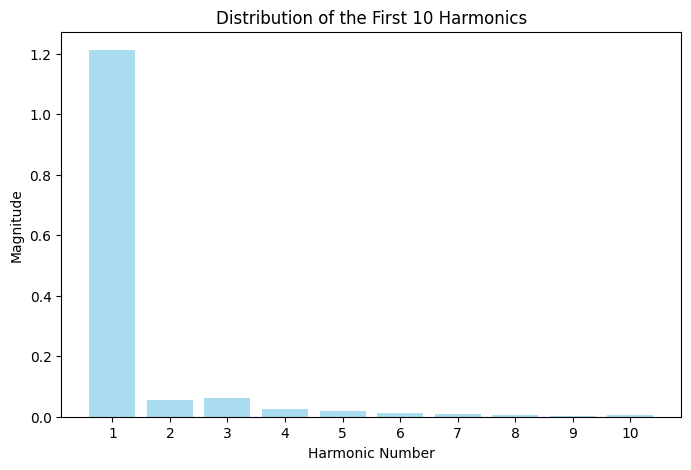

S (computed): 23.23528423627426
S (suggested change): 23.23528393377426
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_122_4.png


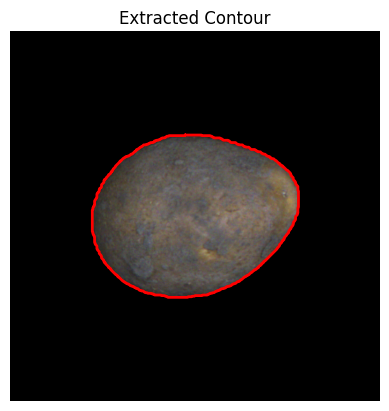

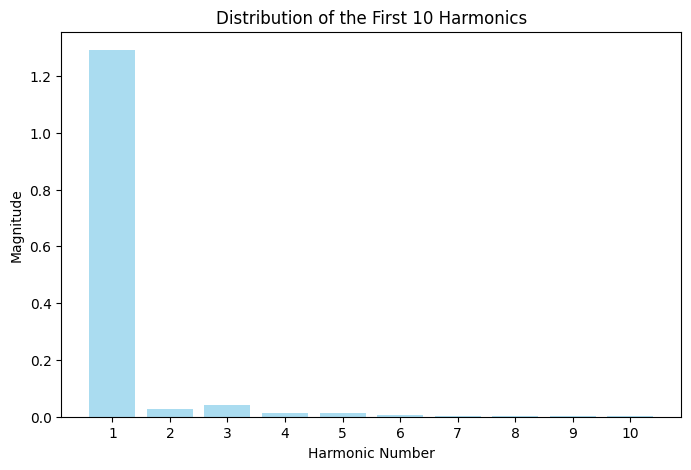

S (computed): 10.568192566442487
S (suggested change): 10.568192263942489
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_126_2.png


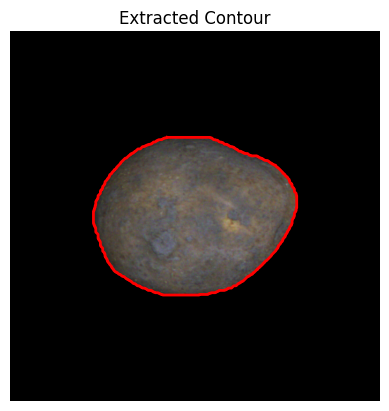

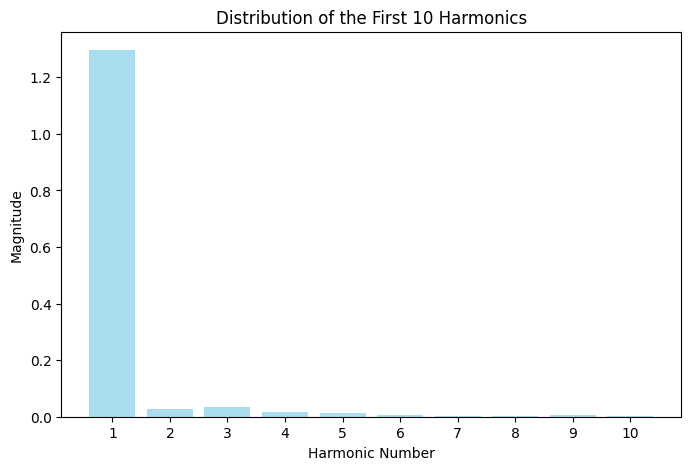

S (computed): 15.61793112632646
S (suggested change): 15.61793082382646
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_124_4.png


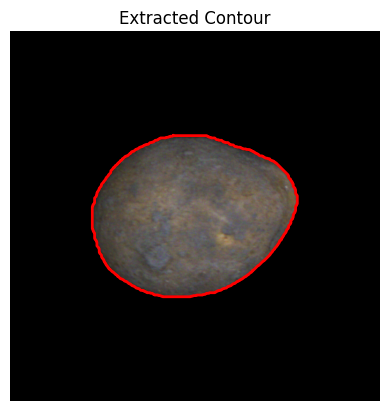

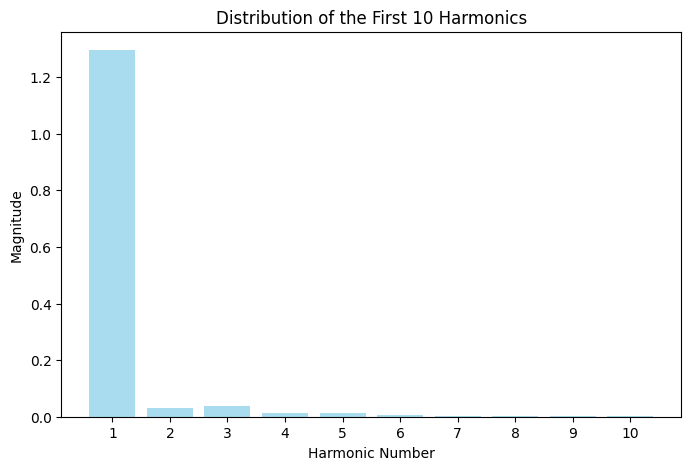

S (computed): 13.077531260319905
S (suggested change): 13.077530957819905
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_126_4.png


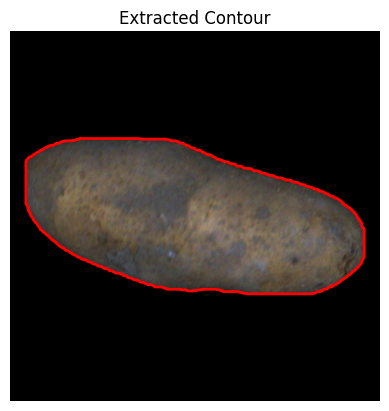

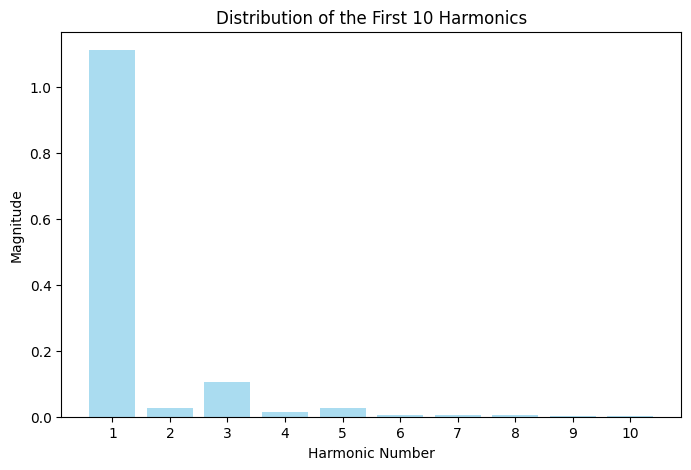

S (computed): 18.52304717354844
S (suggested change): 18.52304687104844
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_124_11.png


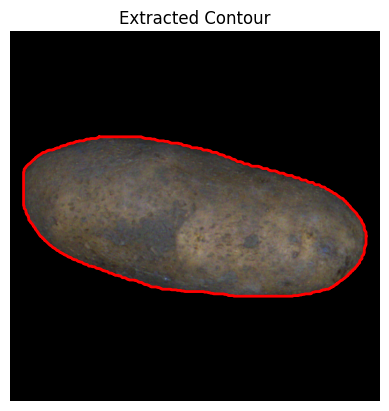

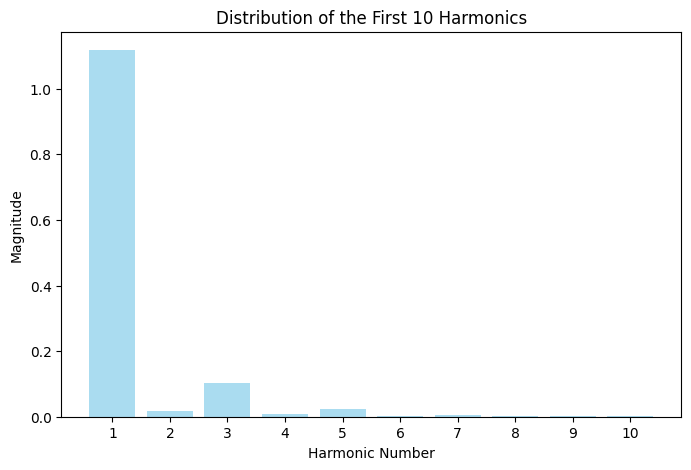

S (computed): 16.793839759237763
S (suggested change): 16.793839456737757
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_116_9.png


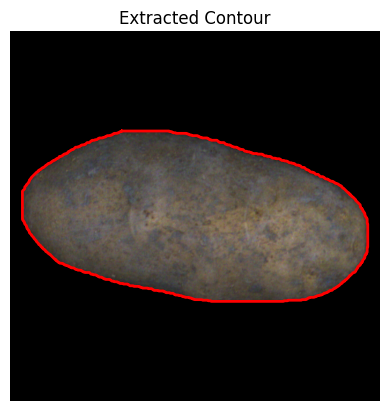

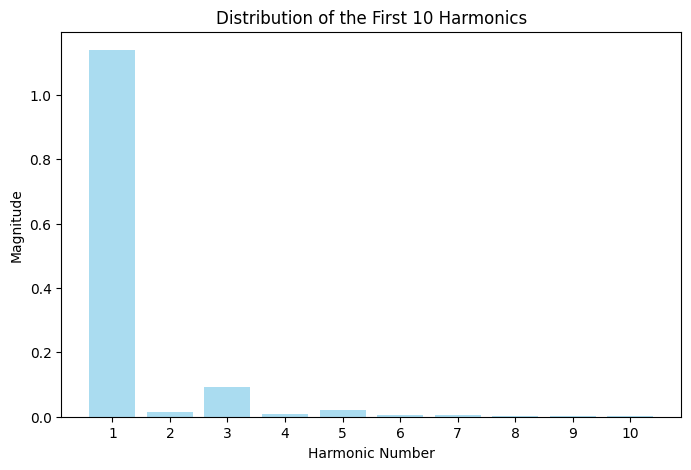

S (computed): 16.30596660704975
S (suggested change): 16.30596630454975
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_102_3.png


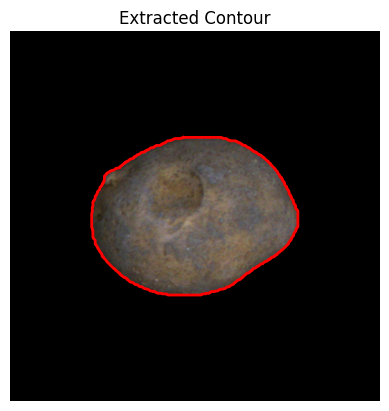

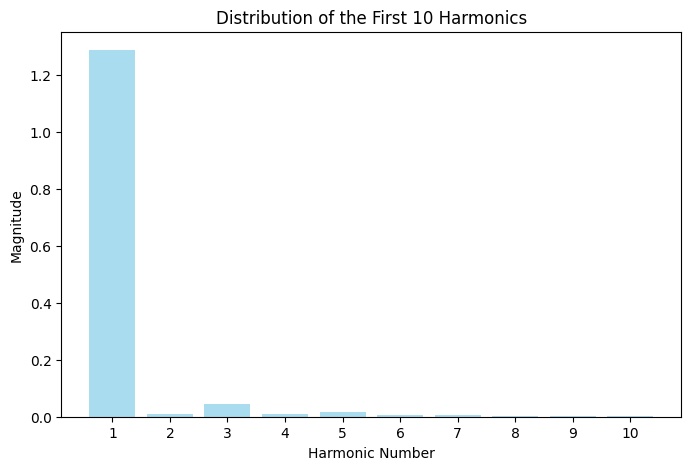

S (computed): 15.173833737751643
S (suggested change): 15.173833435251648
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_100_0.png


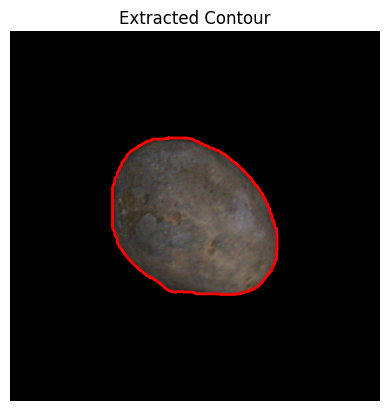

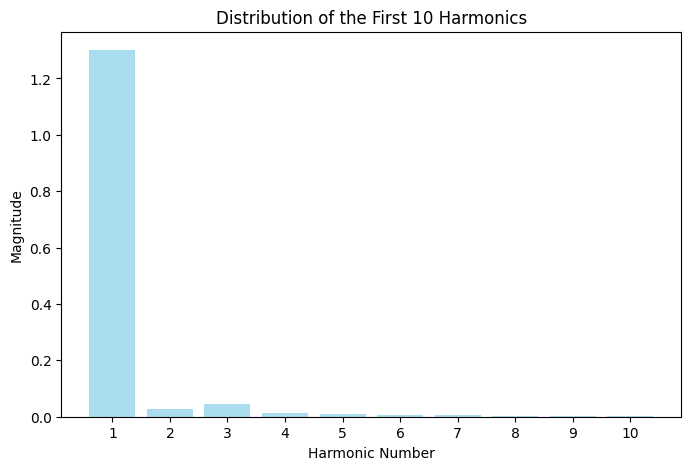

S (computed): 13.996098765623127
S (suggested change): 13.996098463123127
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_124_6.png


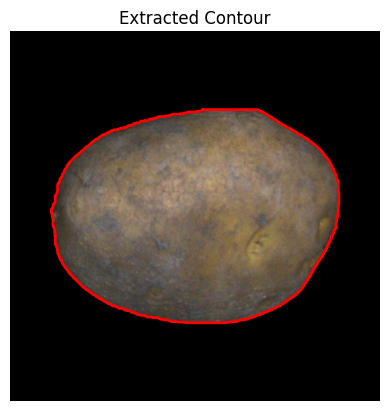

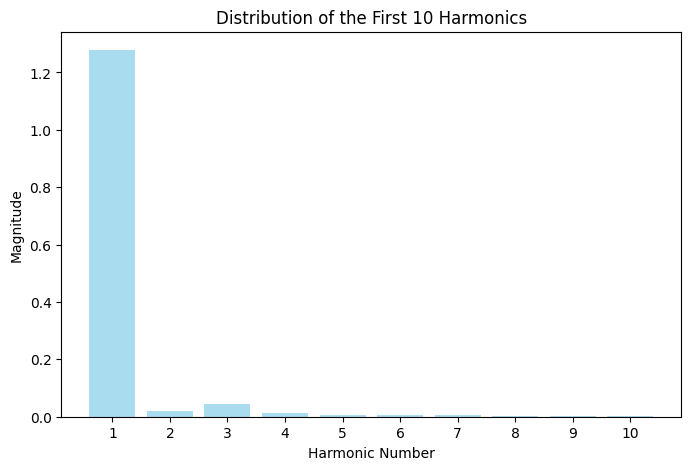

S (computed): 13.614834661345917
S (suggested change): 13.614834358845918
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_124_0.png


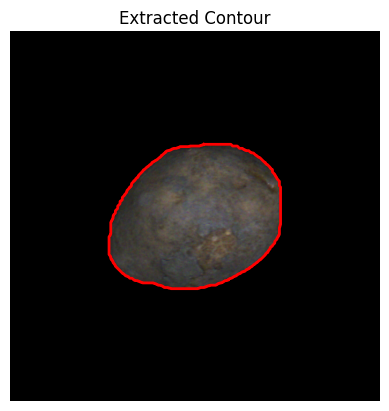

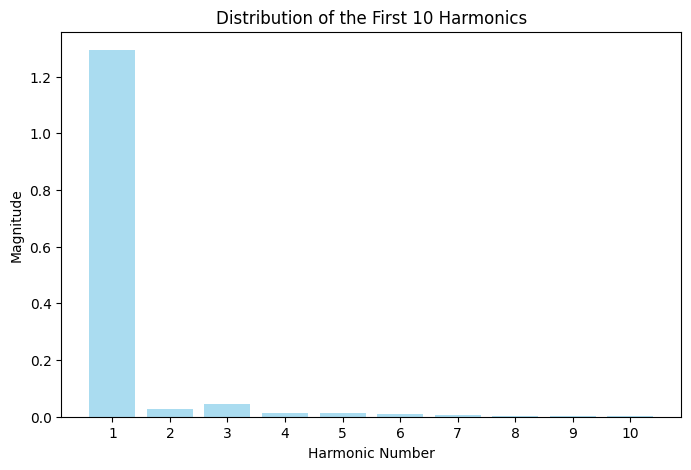

S (computed): 15.717436282309372
S (suggested change): 15.717435979809371
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_110_4.png


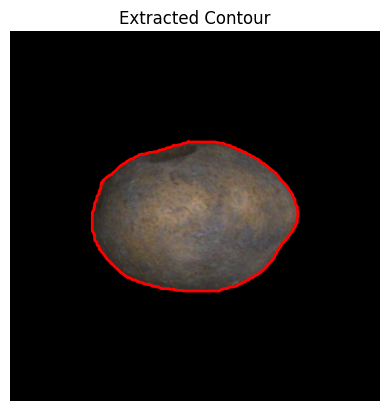

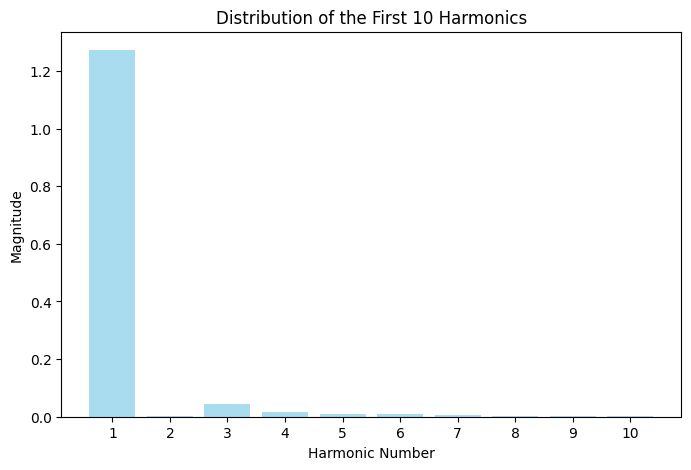

S (computed): 16.530019396289074
S (suggested change): 16.530019093789072
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_130_6.png


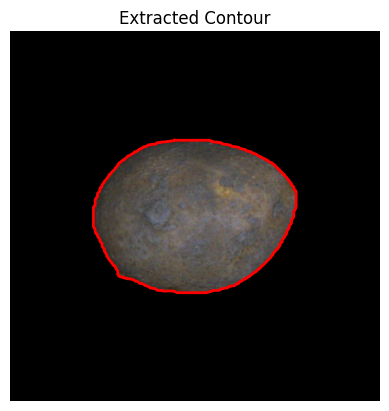

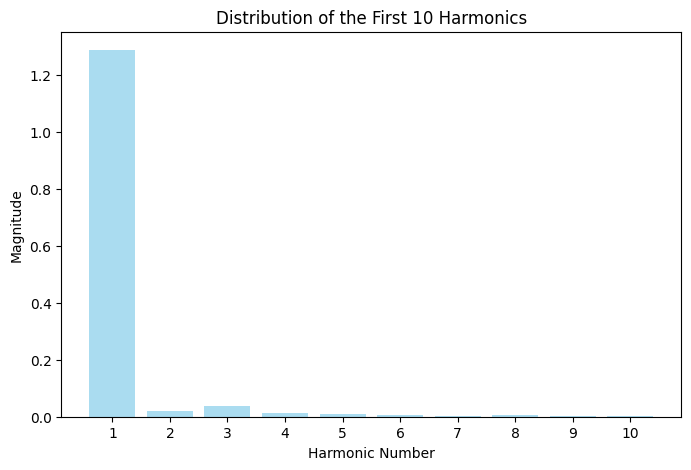

S (computed): 14.576895466534506
S (suggested change): 14.576895164034507
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_128_0.png


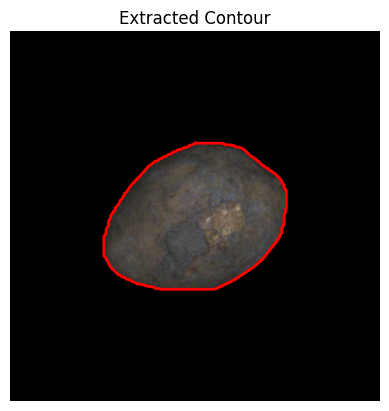

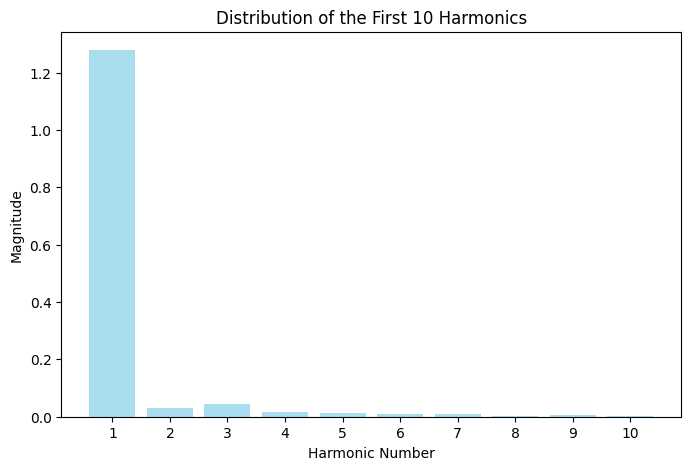

S (computed): 18.70832869849787
S (suggested change): 18.70832839599787
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_118_4.png


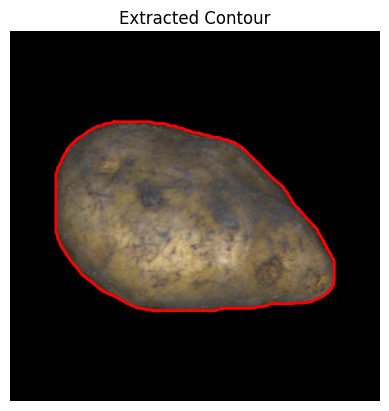

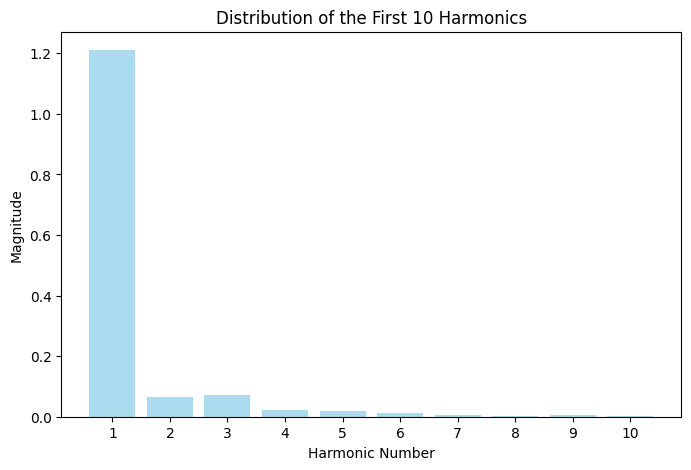

S (computed): 22.78522680884932
S (suggested change): 22.78522650634932
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_116_1.png


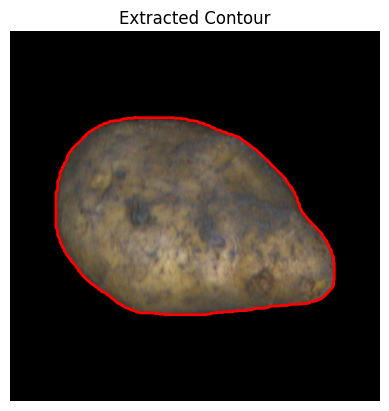

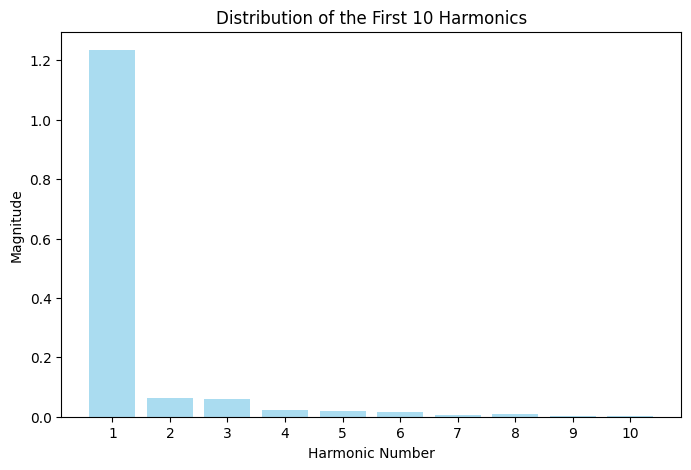

S (computed): 21.973509758696782
S (suggested change): 21.973509456196783
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_100_4.png


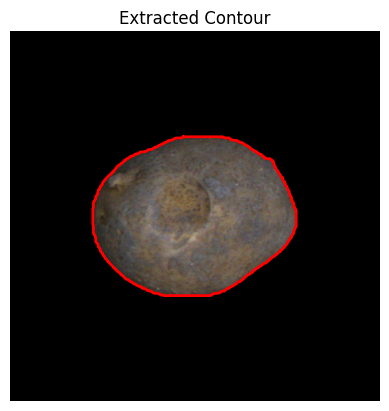

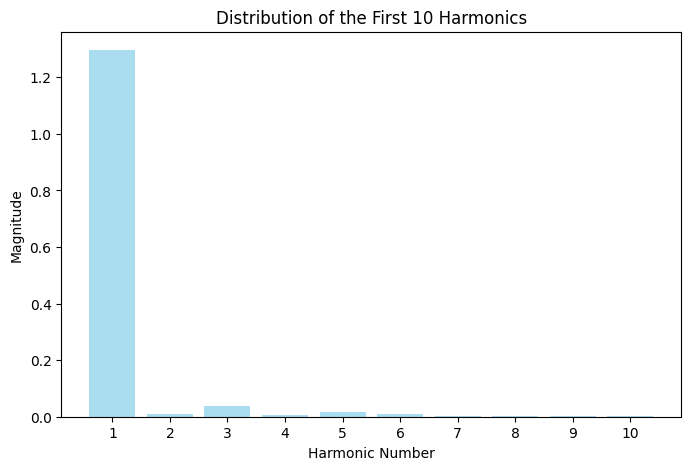

S (computed): 15.803008210942984
S (suggested change): 15.803007908442982
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_122_2.png


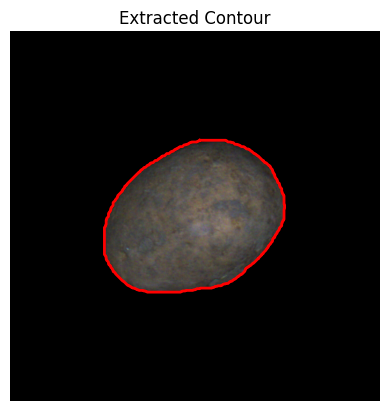

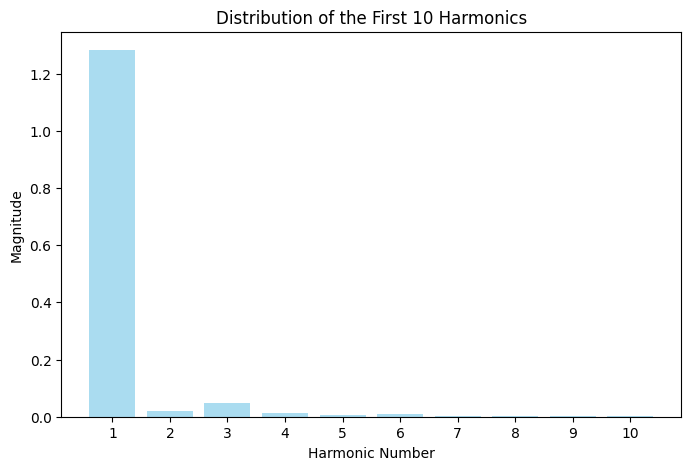

S (computed): 12.431219114870663
S (suggested change): 12.431218812370663
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_112_0.png


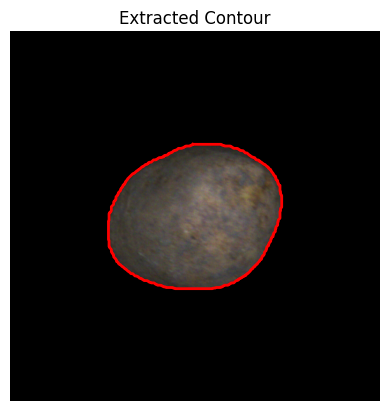

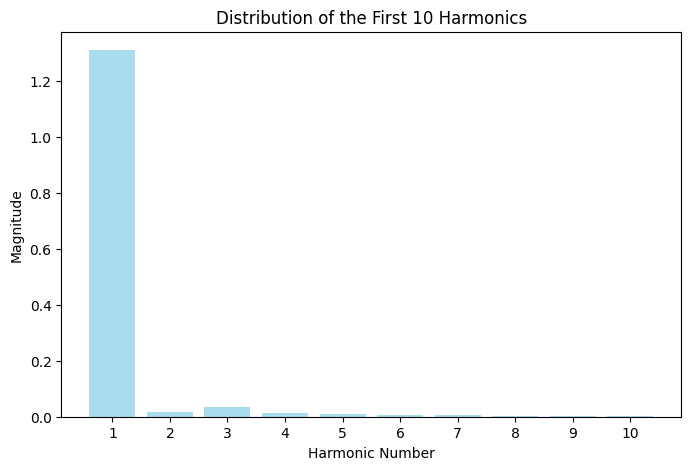

S (computed): 12.787441854898546
S (suggested change): 12.787441552398546
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_108_2.png


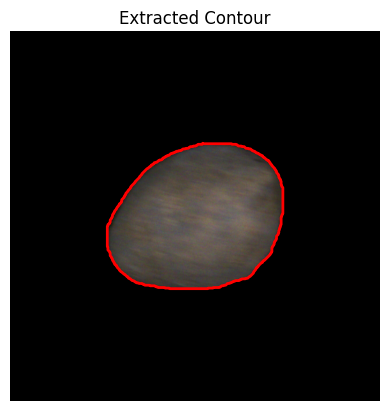

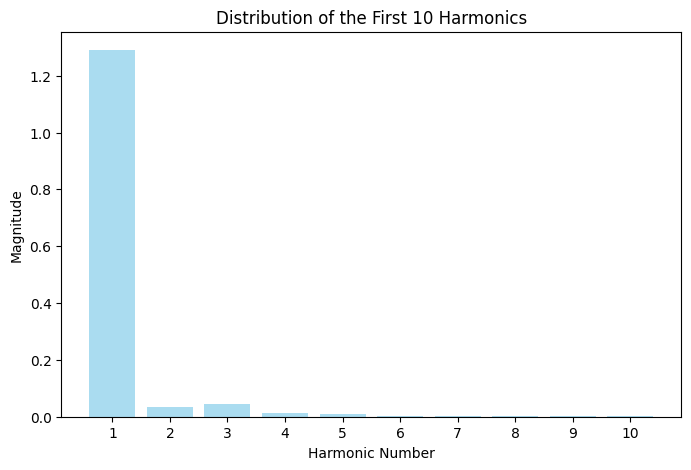

S (computed): 11.24162813089219
S (suggested change): 11.24162782839219
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_130_4.png


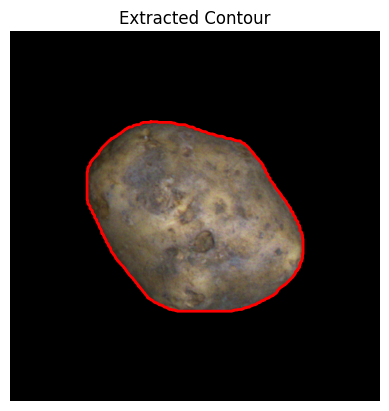

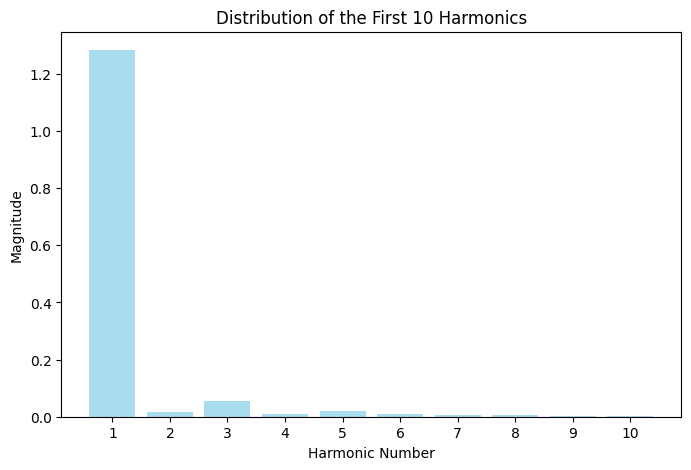

S (computed): 19.29042615847206
S (suggested change): 19.29042585597206
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_132_1.png


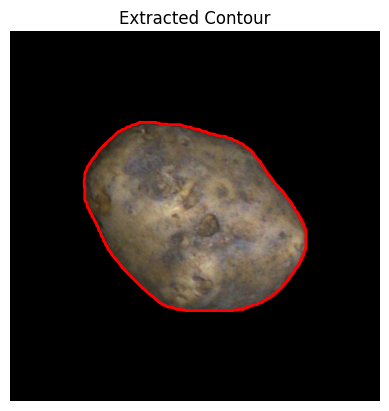

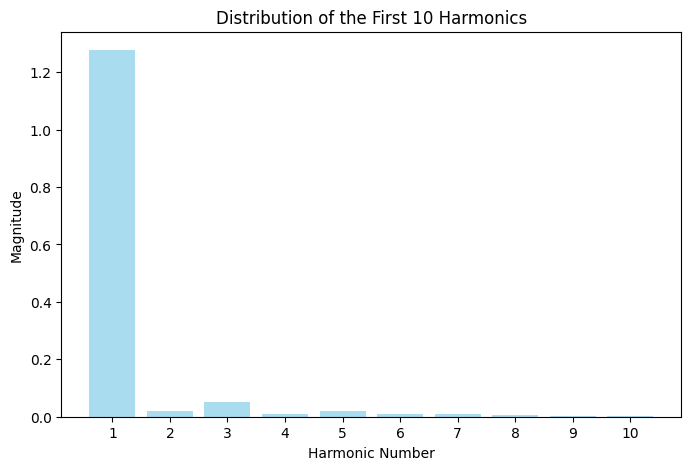

S (computed): 18.408373721049152
S (suggested change): 18.408373418549154
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_104_3.png


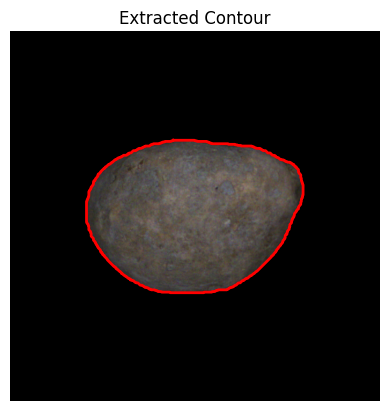

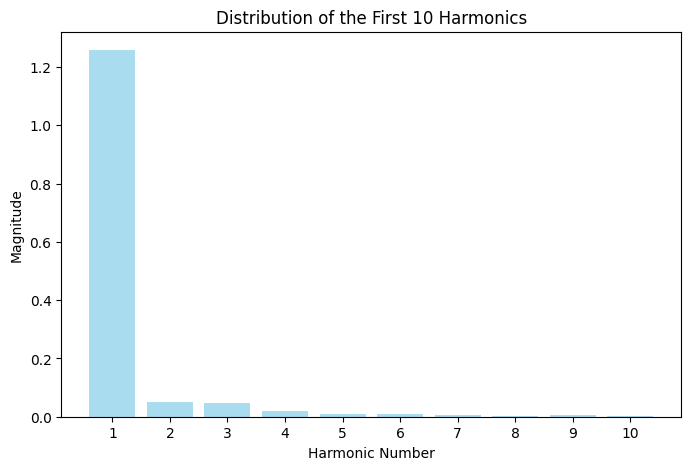

S (computed): 18.74467194704828
S (suggested change): 18.74467164454828
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_114_1.png


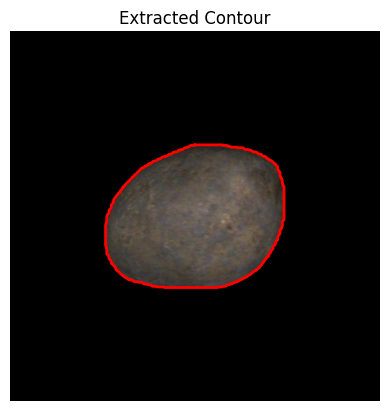

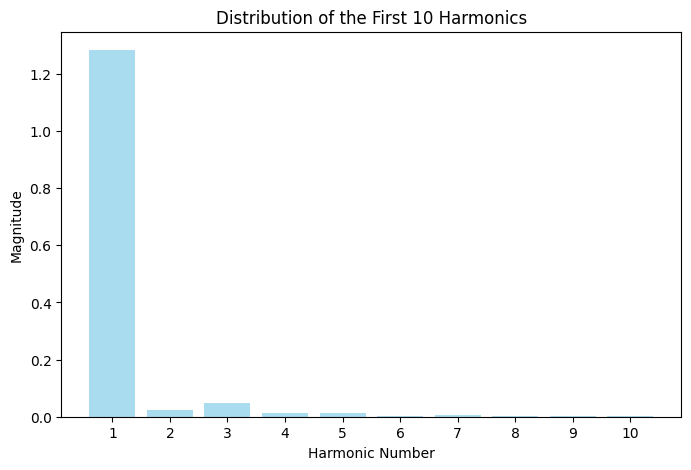

S (computed): 13.603349557378447
S (suggested change): 13.603349254878447
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_122_0.png


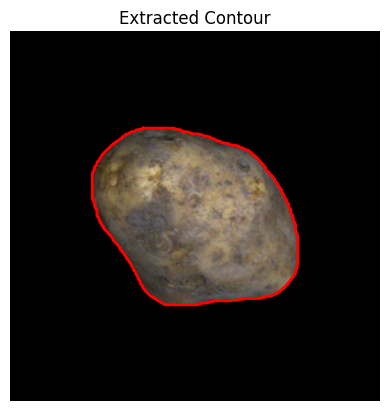

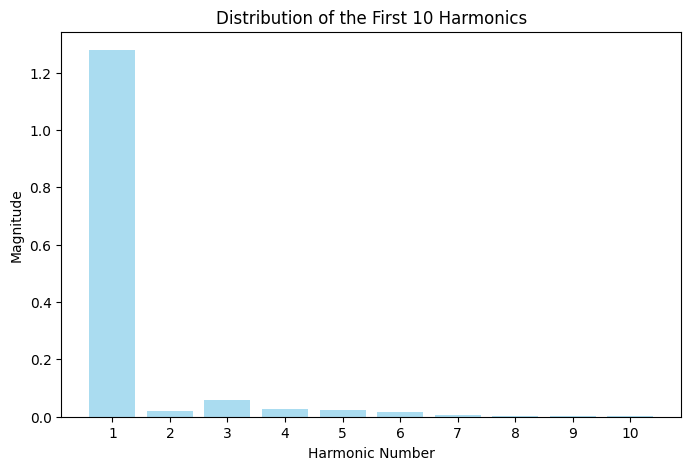

S (computed): 19.54904864973768
S (suggested change): 19.54904834723768
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_128_9.png


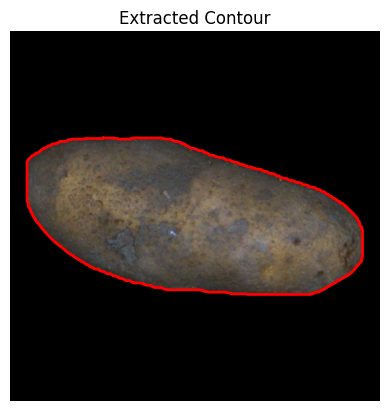

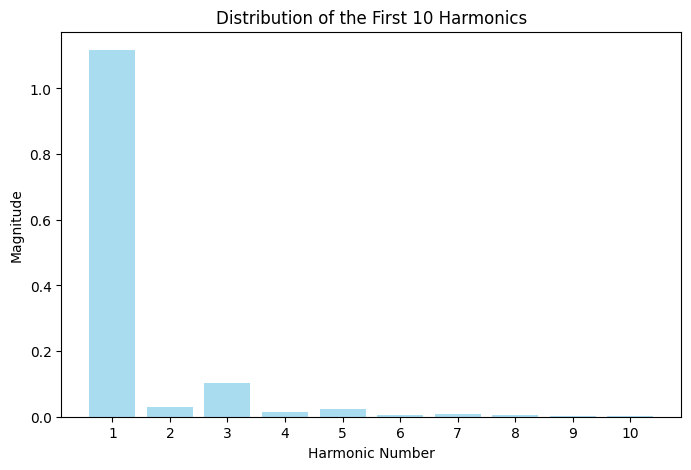

S (computed): 17.21749990169301
S (suggested change): 17.217499599193008
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_108_0.png


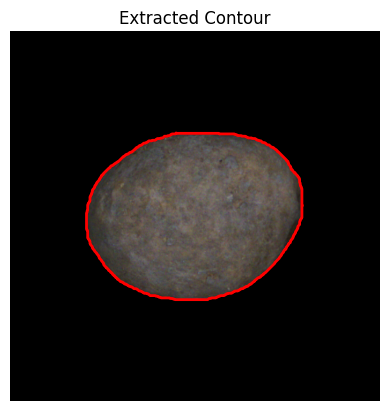

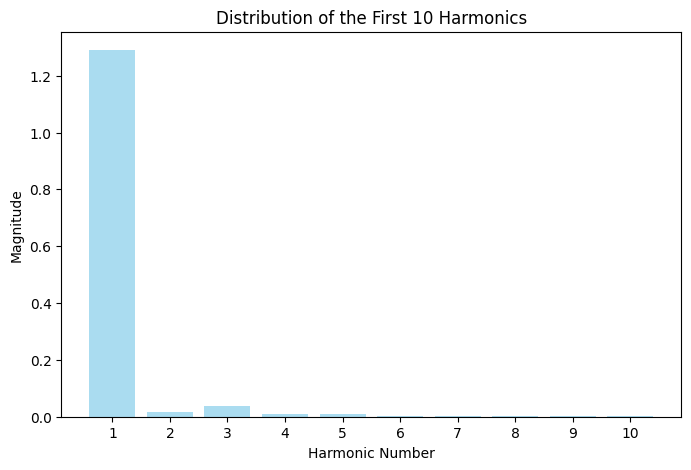

S (computed): 9.730348264405631
S (suggested change): 9.730347961905629
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_130_13.png


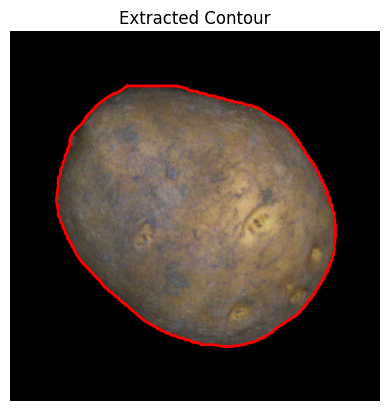

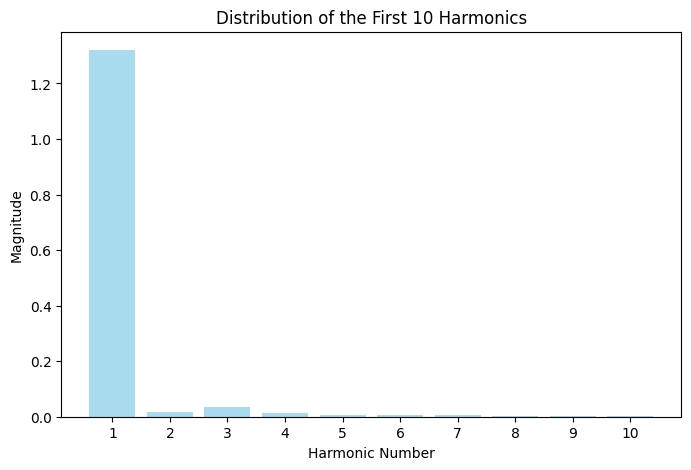

S (computed): 11.73133122865104
S (suggested change): 11.731330926151042
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_110_3.png


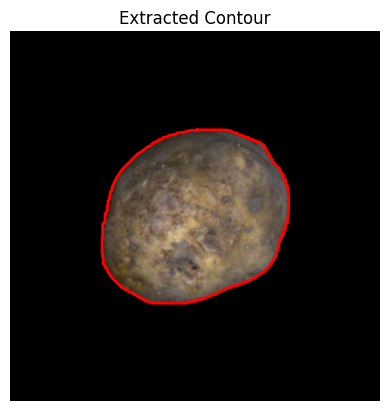

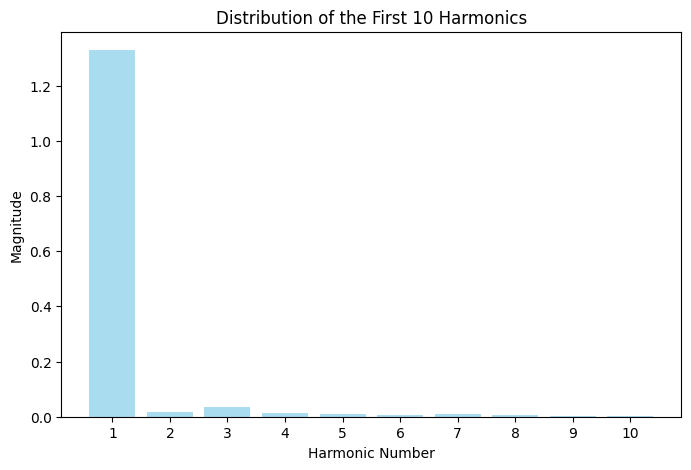

S (computed): 17.30141992055617
S (suggested change): 17.301419618056173
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_104_2.png


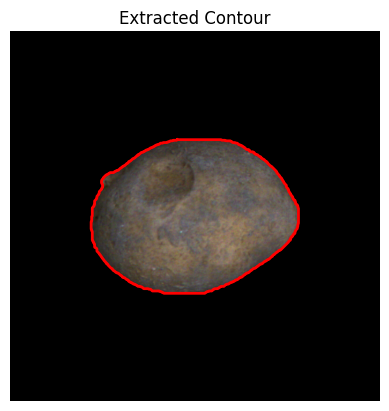

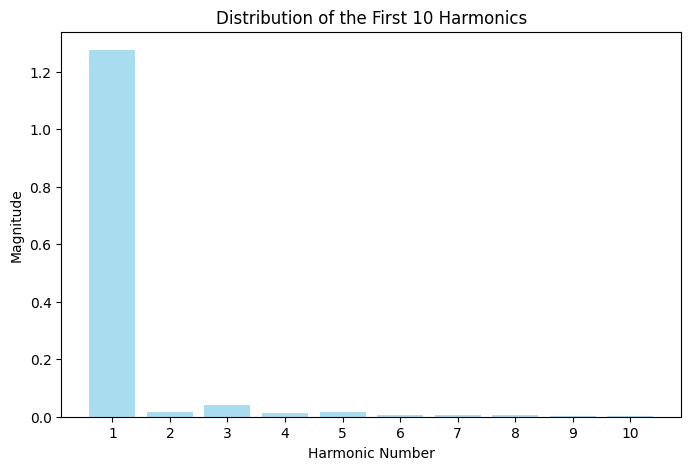

S (computed): 17.030337687435775
S (suggested change): 17.030337384935777
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_114_9.png


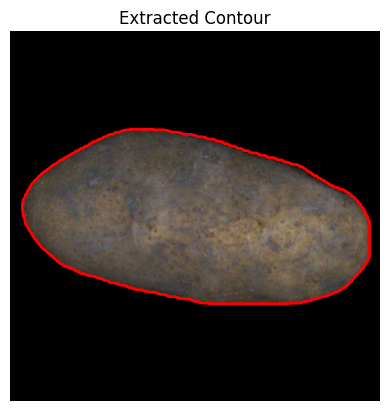

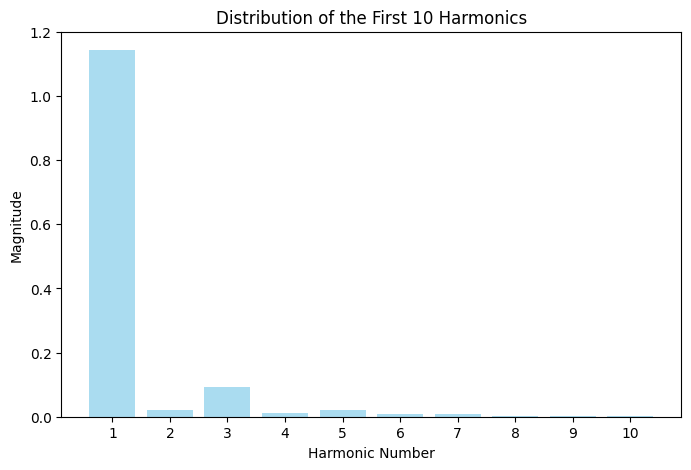

S (computed): 18.648749632948995
S (suggested change): 18.648749330448997
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_128_2.png


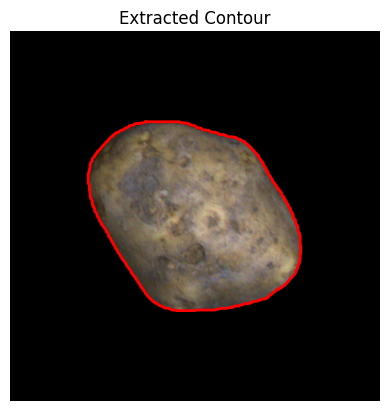

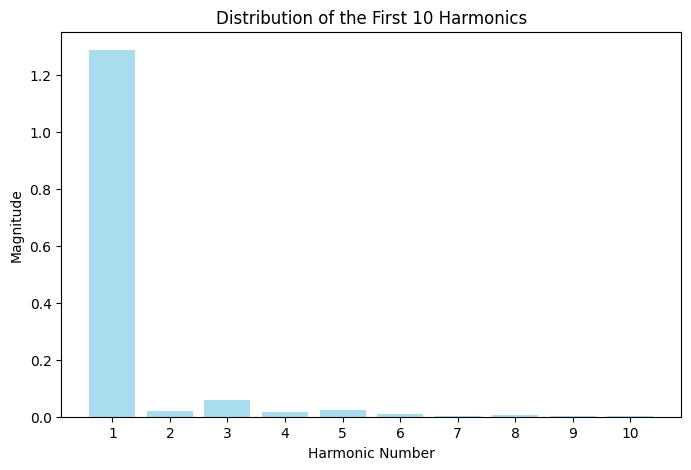

S (computed): 19.14373810819018
S (suggested change): 19.14373780569018
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_118_7.png


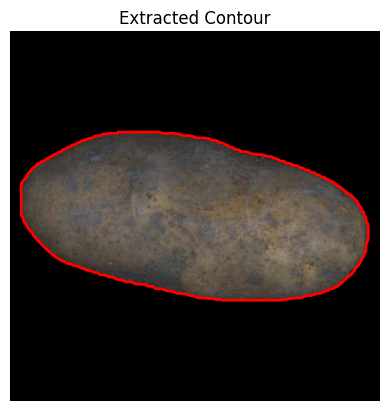

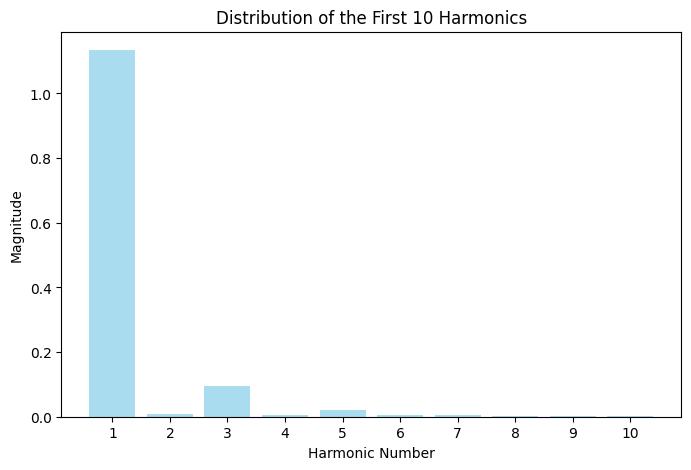

S (computed): 15.767427015144433
S (suggested change): 15.767426712644433
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_100_1.png


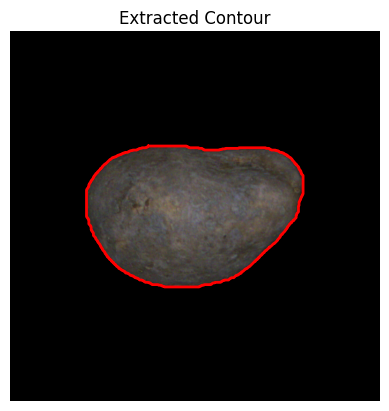

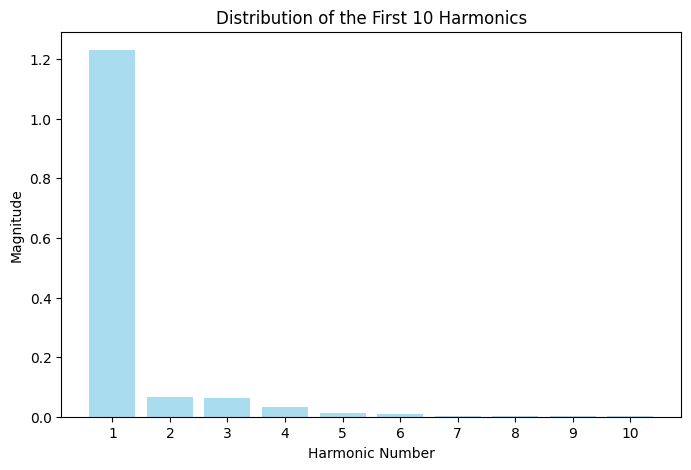

S (computed): 14.474865650982796
S (suggested change): 14.474865348482794
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_112_3.png


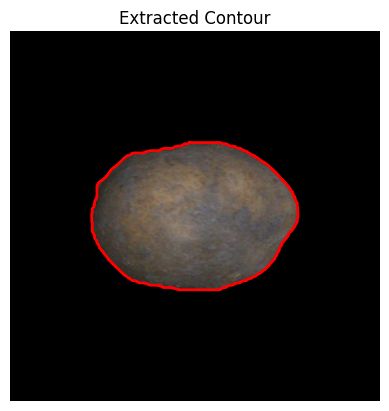

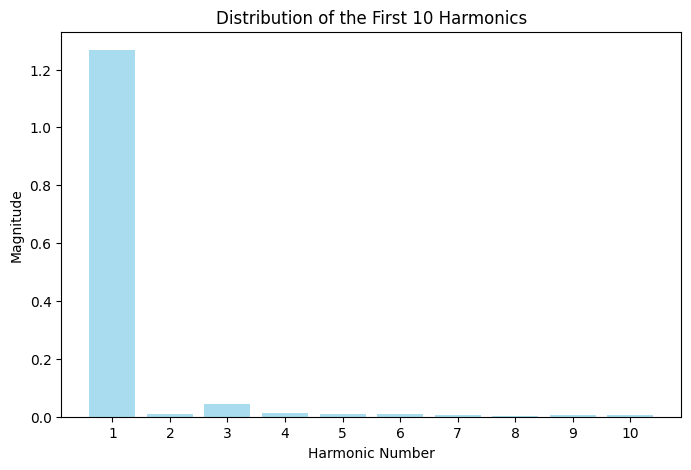

S (computed): 20.939196239342124
S (suggested change): 20.939195936842125
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_116_12.png


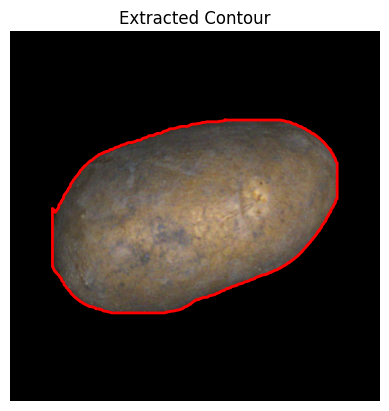

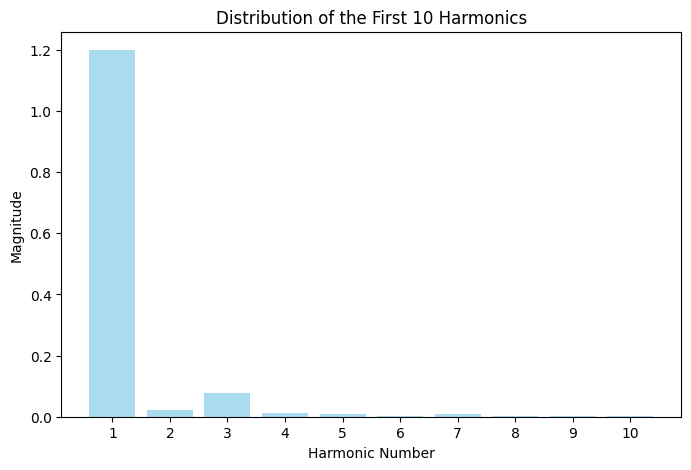

S (computed): 16.18001333711421
S (suggested change): 16.180013034614213
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_120_0.png


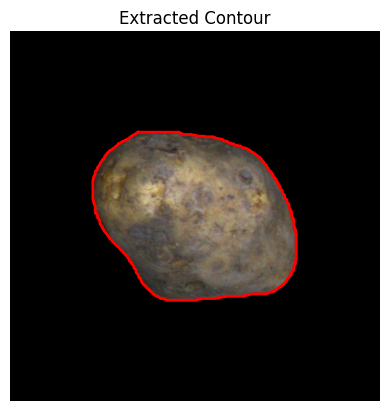

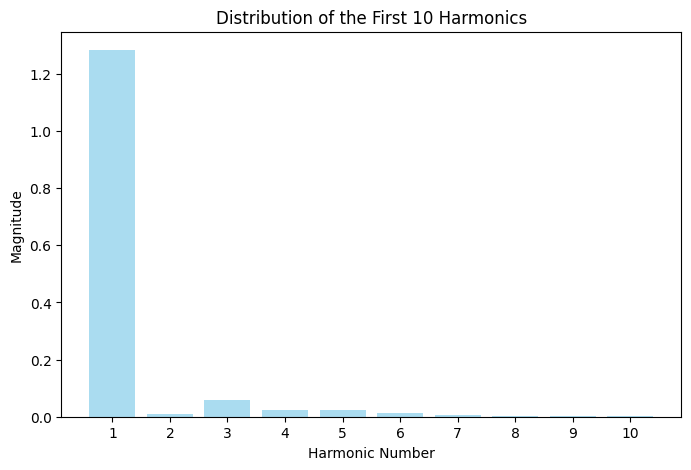

S (computed): 20.55159082507455
S (suggested change): 20.551590522574546
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_126_1.png


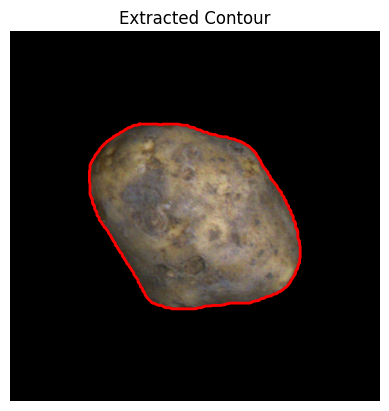

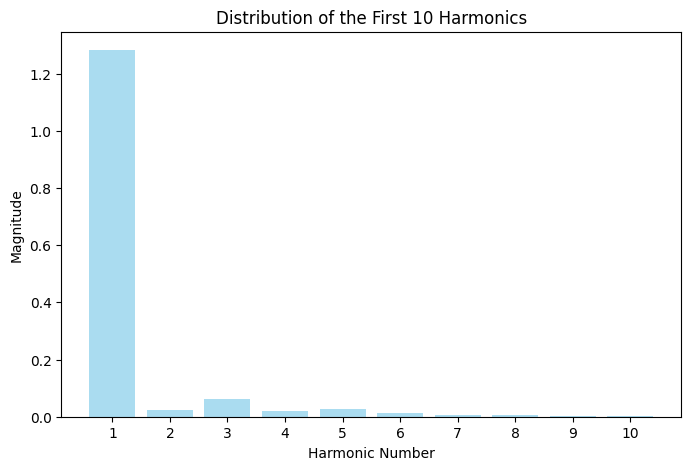

S (computed): 21.70766352193752
S (suggested change): 21.707663219437517
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_116_6.png


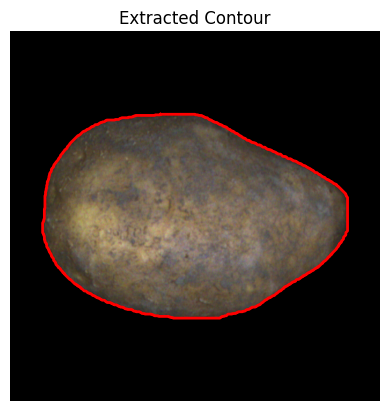

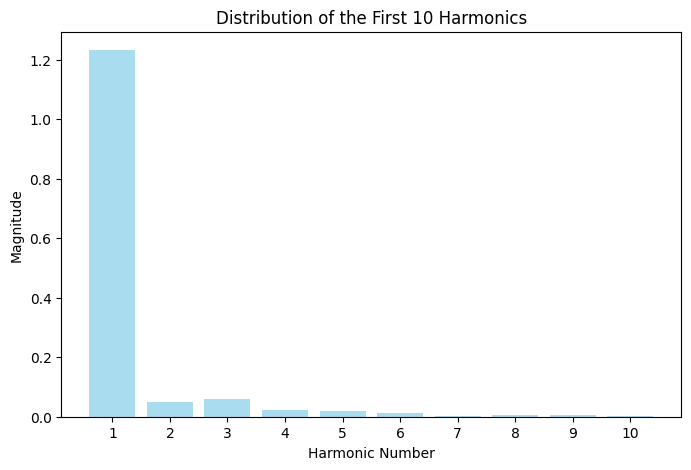

S (computed): 18.297056299587364
S (suggested change): 18.29705599708737
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_120_10.png


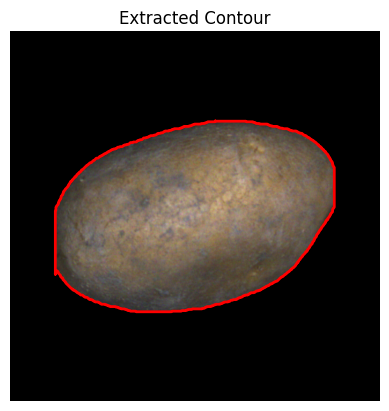

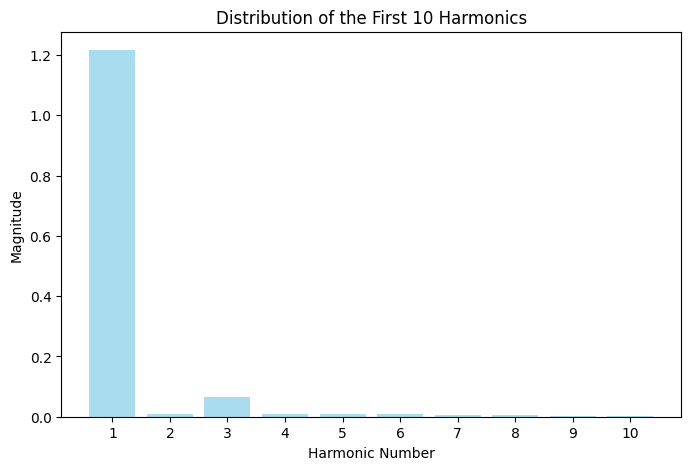

S (computed): 16.270122568876225
S (suggested change): 16.270122266376227
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_128_12.png


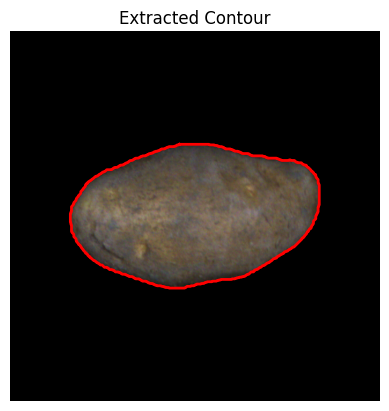

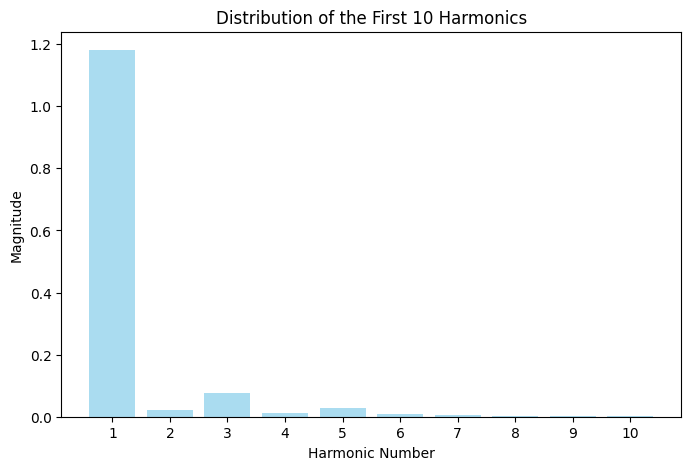

S (computed): 20.11797061468529
S (suggested change): 20.117970312185292
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_128_13.png


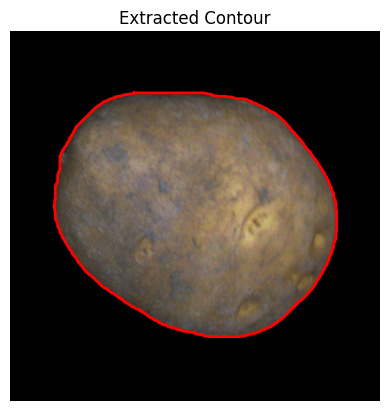

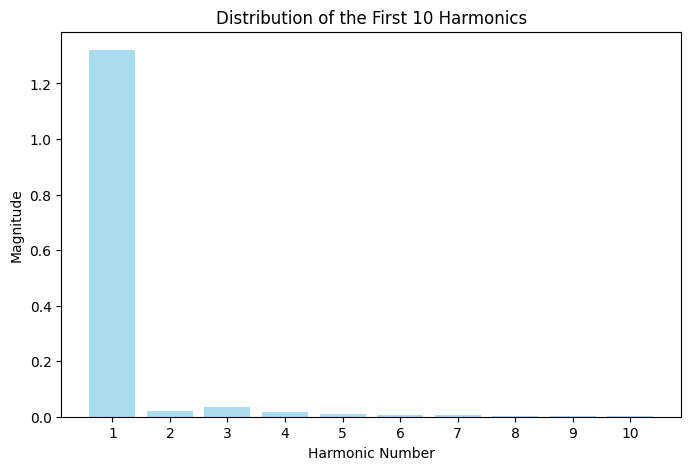

S (computed): 13.024617612371877
S (suggested change): 13.024617309871875
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_108_8.png


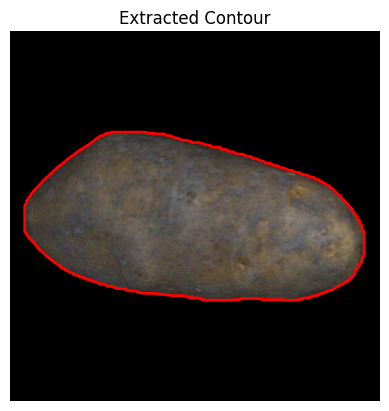

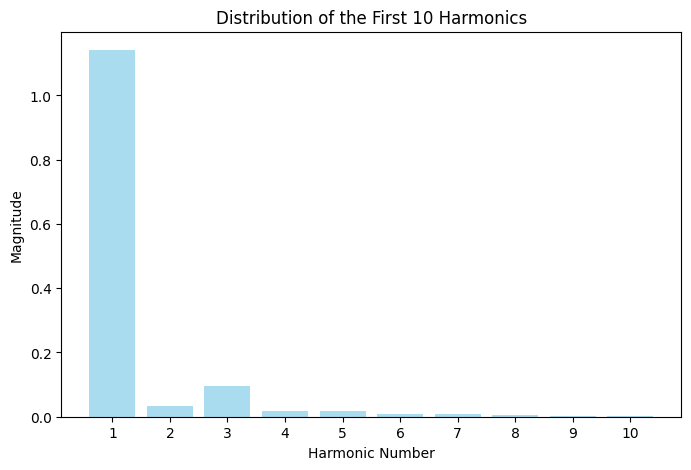

S (computed): 17.230445987830162
S (suggested change): 17.23044568533016
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_116_2.png


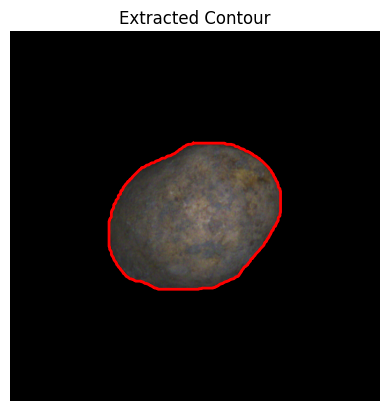

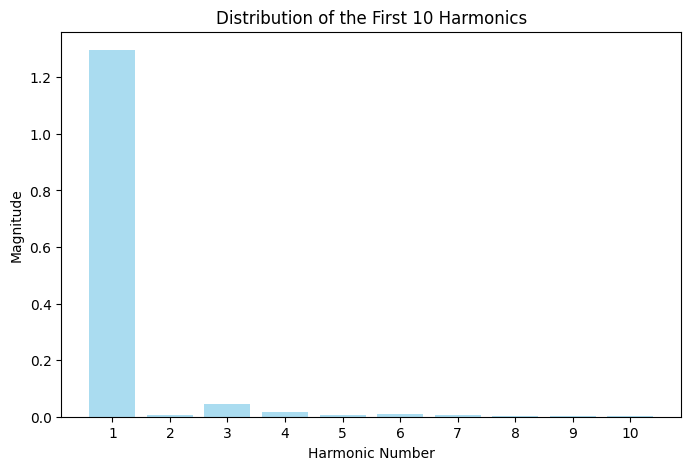

S (computed): 15.96625878170186
S (suggested change): 15.966258479201858
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_130_12.png


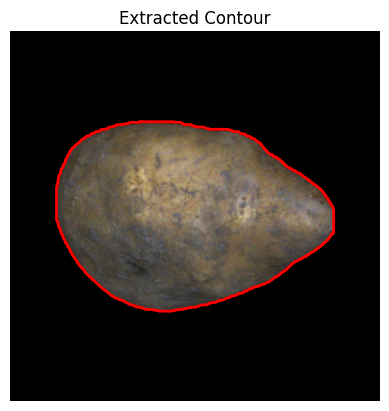

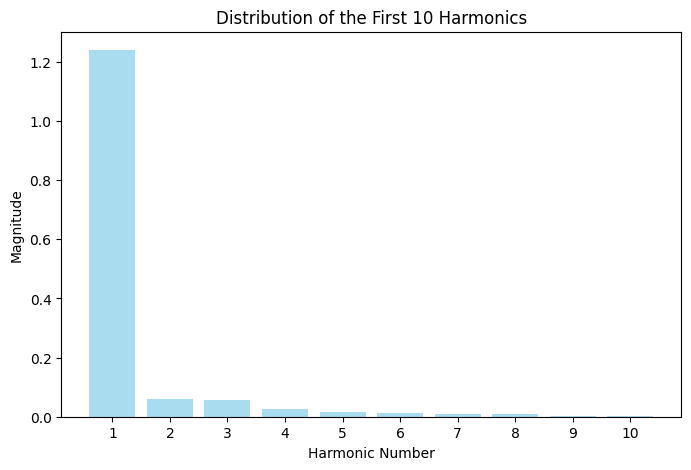

S (computed): 22.148479949984615
S (suggested change): 22.148479647484614
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_130_11.png


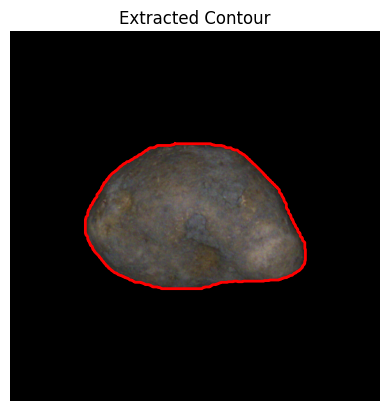

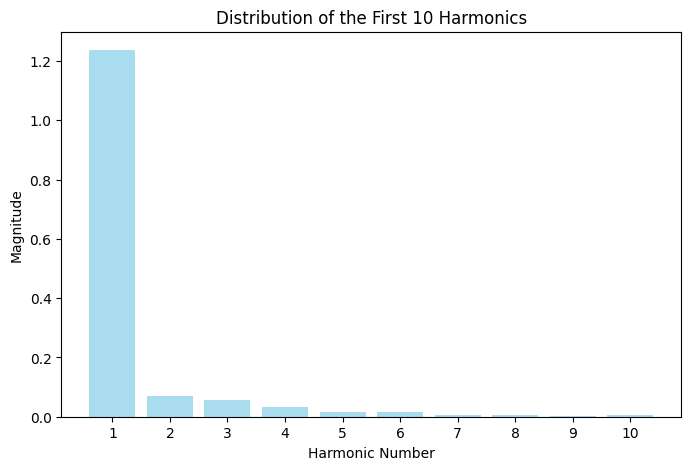

S (computed): 23.82855435680397
S (suggested change): 23.82855405430398
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_108_3.png


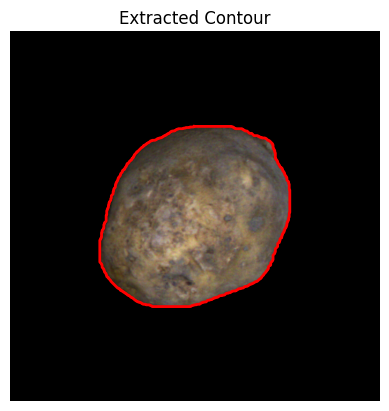

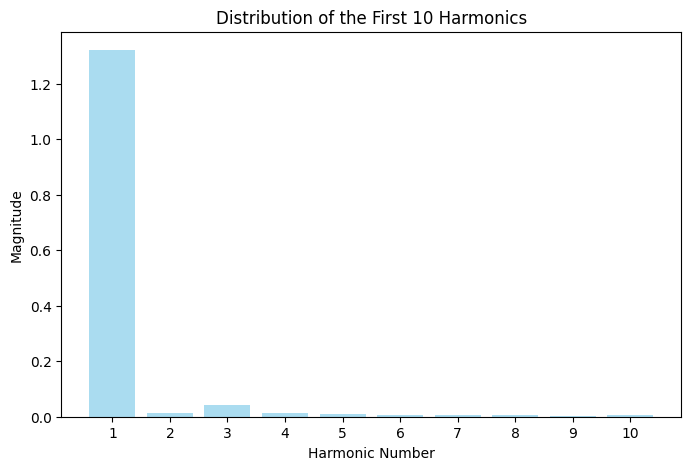

S (computed): 20.411961146914784
S (suggested change): 20.411960844414793
------------------------------------------------------------
Processing image: /home/mishkat/Documents/malformed_potato/5_classes_malformed/good/Afra_12_2_1_128_11.png


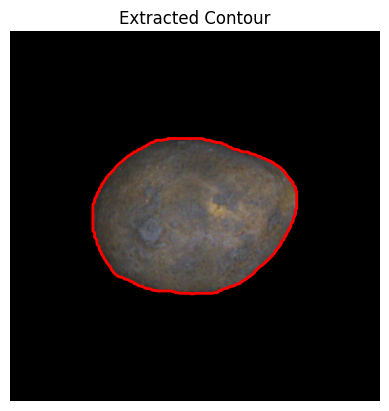

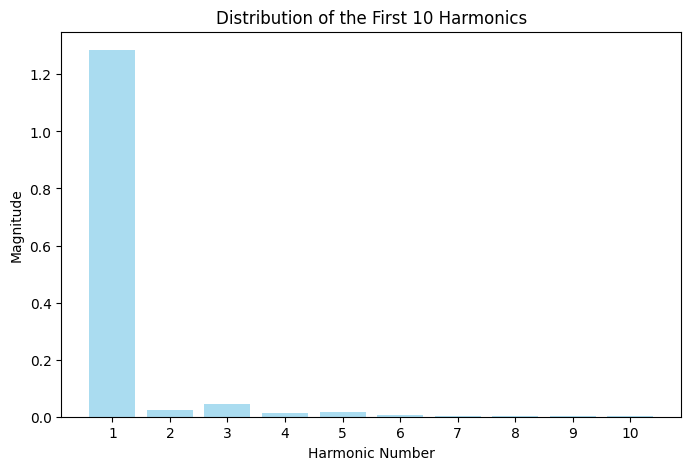

S (computed): 12.224180975356155
S (suggested change): 12.224180672856157
------------------------------------------------------------


In [16]:
# Process images in the specified folder
process_images_in_folder(folder_path)

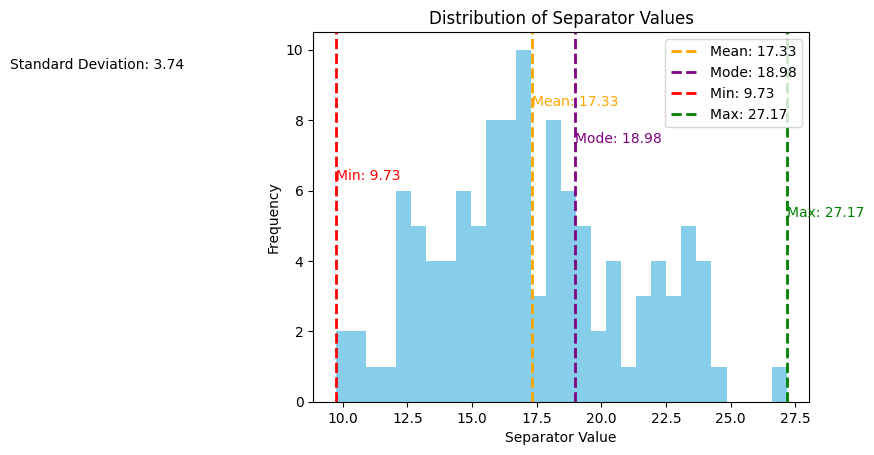

In [17]:
# Assuming separator_values_1 is a list of separator values
plt.hist(separator_values_compute_s, bins=30, color='skyblue')

# Calculate mean, standard deviation, mode, min, and max
mean_value = statistics.mean(separator_values_compute_s)
std_dev = statistics.stdev(separator_values_compute_s)
mode_value = statistics.mode(separator_values_compute_s)
min_value = min(separator_values_compute_s)
max_value = max(separator_values_compute_s)

# Add vertical lines for mean, mode, min, and max
plt.axvline(mean_value, color='orange', linestyle='--', linewidth=2, label=f'Mean: {mean_value:.2f}')
plt.axvline(mode_value, color='purple', linestyle='--', linewidth=2, label=f'Mode: {mode_value:.2f}')
plt.axvline(min_value, color='red', linestyle='--', linewidth=2, label=f'Min: {min_value:.2f}')
plt.axvline(max_value, color='green', linestyle='--', linewidth=2, label=f'Max: {max_value:.2f}')

# Add text annotations for mean, standard deviation, mode, min, and max
plt.text(mean_value, plt.ylim()[1] * 0.8, f'Mean: {mean_value:.2f}', color='orange')
plt.text(mode_value, plt.ylim()[1] * 0.7, f'Mode: {mode_value:.2f}', color='purple')
plt.text(min_value, plt.ylim()[1] * 0.6, f'Min: {min_value:.2f}', color='red')
plt.text(max_value, plt.ylim()[1] * 0.5, f'Max: {max_value:.2f}', color='green')
plt.text(0.5, plt.ylim()[1] * 0.9, f'Standard Deviation: {std_dev:.2f}', ha='center')

# Add labels, title, and legend
plt.xlabel("Separator Value")
plt.ylabel("Frequency")
plt.title("Distribution of Separator Values")
plt.legend()
plt.show()